### Running Analysis on the Entire Dataset!!! \(Education data, Socioeconomic Data, and Health Data\)



##### Imports



In [1]:
# Basics
import pandas as pd
import numpy as np

# Reduce anxiety while running code
from tqdm import tqdm

# Plotting
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Sklearn utilities
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate

# Sklearn models
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree

In [2]:
finalDataset = pd.read_csv("../Clean Data/finalDataset.csv")

###### It is important to see the data first to get a sense of the values before beginning with model creation and fitting.



In [3]:
# Dropping redundant columns before beginning with the analysis
finalDataset.drop('state',axis=1)
finalDataset.drop('county',axis=1)

# Check that the data looks ok
finalDataset.head()

,stateInitials,stateName,countyName,countyID,tractID,population,noHealthInsurance%,arthritis%,bingeDrinking%,highBP%,...,"%SomeCollege,NoDegree",%AssociatesDegree,%BachelorsDegree,%GraduateOrProfessionalDegree,%PercentHighSchoolGraduateOrHigher,%PercentBachelorsDegreeOrHigher,%PovertyLessThanHighSchoolGraduate,%PovertyHighSchoolGraduate,%PovertySomeCollegeOrAssociatesDegree,%PovertyBachelorsDegreeOrHigher
0,AZ,Arizona,Maricopa,4013,4013422643,5789,11.9,17.0,19.9,23.7,...,28.8,12.5,23.8,9.8,95.3,33.5,14.8,10.0,5.7,2.0
1,CA,California,Sacramento,6067,6067007402,6180,15.4,24.6,19.6,30.5,...,24.7,7.8,9.9,3.2,82.9,13.1,45.0,23.5,13.3,6.9
2,AL,Alabama,Madison,1089,1089000201,760,25.4,36.0,10.5,53.7,...,27.3,6.0,7.8,2.5,74.3,10.3,45.8,20.4,26.4,22.6
3,AL,Alabama,Montgomery,1101,1101002202,1185,25.2,36.1,10.9,54.6,...,12.0,3.7,3.4,0.9,68.1,4.3,35.5,26.6,19.2,0.0
4,AL,Alabama,Butler,1013,1013952800,1394,14.3,36.0,13.4,43.0,...,17.3,10.3,20.3,13.8,91.2,34.1,19.8,21.7,10.2,10.5


##### We will now also see what all columns we are working with...



In [4]:
finalDataset.columns

Index(['stateInitials', 'stateName', 'countyName', 'countyID', 'tractID',
       'population', 'noHealthInsurance%', 'arthritis%', 'bingeDrinking%',
       'highBP%', 'medicineToLowerBP%', 'nonSkinCancer%', 'currentAsthma%',
       'cervicalCancer%', 'coronaryHeartDisease%', 'routineCheckUp%',
       'cholestorolScreening%', 'colonScreening%',
       'chronicObstructivePulmonaryDisease%',
       'menUpToDateOnVaccinesAndScreenings%',
       'womenUpToDateOnVaccinesAndScreenings%', 'currentSmoking%',
       'routineDentalCheckup%', 'depression%', 'diabetes%',
       'fairOrGoodHealth%', 'highCholestorol%', 'chronicKidneyDisease%',
       'noLeisurelyPhysicalActivity%', 'mammographyUseWomen%',
       'badMentalHealth%', 'obesity%', 'badPhysicalHealth%',
       'lessThan7HoursOfSleep%', 'stroke%', 'allTeethLost%', 'state', 'county',
       'totalPop', 'men', 'women', 'hispanic', 'white', 'black', 'native',
       'asian', 'pacific', 'votingAgeCitizen', 'income', 'incomeErr',
       'incom

##### Generate a heat map to look at the linear relationships in our data



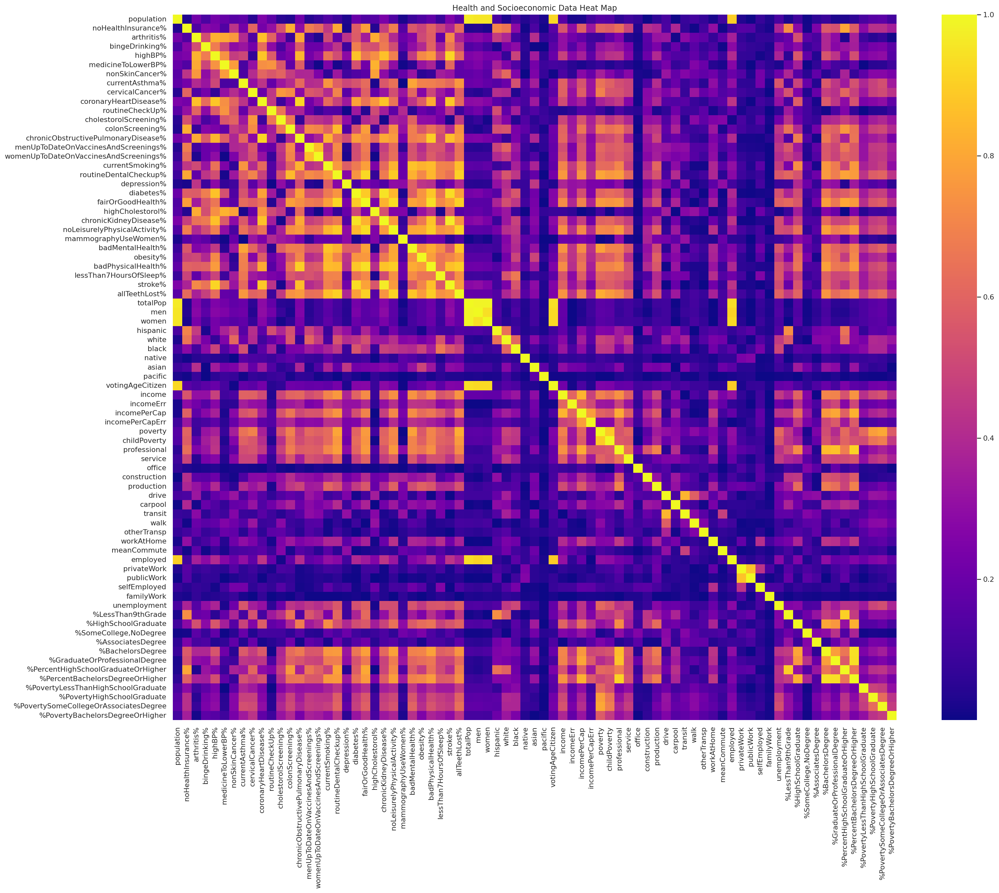

In [5]:
# Set graph size
sns.set(rc = {'figure.figsize':(25,20)})

# Generate and label heatmap with all columns except for the first 5 (state, county, and tract information)
sns.heatmap(np.abs(finalDataset[finalDataset.columns[5:]].corr()), cmap="plasma")
plt.title("Health and Socioeconomic Data Heat Map", fontsize=12)
plt.show()

##### Before we start our analysis, we need to add region information for each tract, as it was one of the things we wanted to explore



In [4]:
def create_regions(initials):
    midwest = ["ND", "SD", "MN", "IA", "MO", "KS", "WI", "IL", "IN", "MI", "OH", "NE"]
    west = ["CA", "OR", "WA", "ID", "MT", "WY", "UT", "CO", "NM", "AZ", "AK", "HI", "NV"]
    south = ["TX", "OK", "AR", "LA", "KY", "TN", "MS", "AL", "WV", "DE", "MD", "DC", "VA", "NC", "SC", "GA", "FL"]
    northeast = ["PA", "NY", "VT", "NH", "MA", "CT", "RI", "ME"]
    regions = []
    #For each tract's state initials, classify its region based on which region array its initials are in.
    for initial in initials:
        if initial in midwest:
            regions.append("MW")
        elif initial in west:
            regions.append("W")
        elif initial in south:
            regions.append("S")
        elif initial in northeast:
            regions.append("NE")
        else:
            #Sanity check (seeing if there is unclassified data)
            regions.append("")
    return regions

In [5]:
finalDataset["regionInitials"] = create_regions(finalDataset.stateInitials)

##### First, we can look at trends across regions



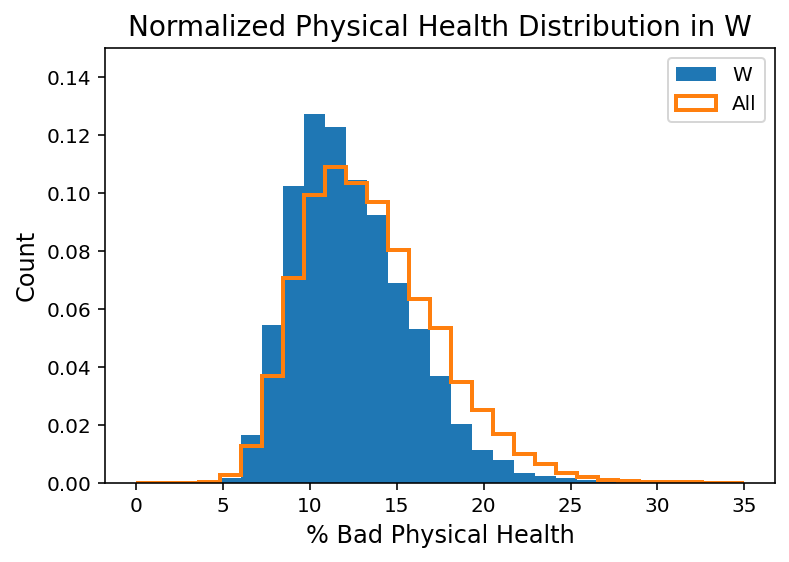

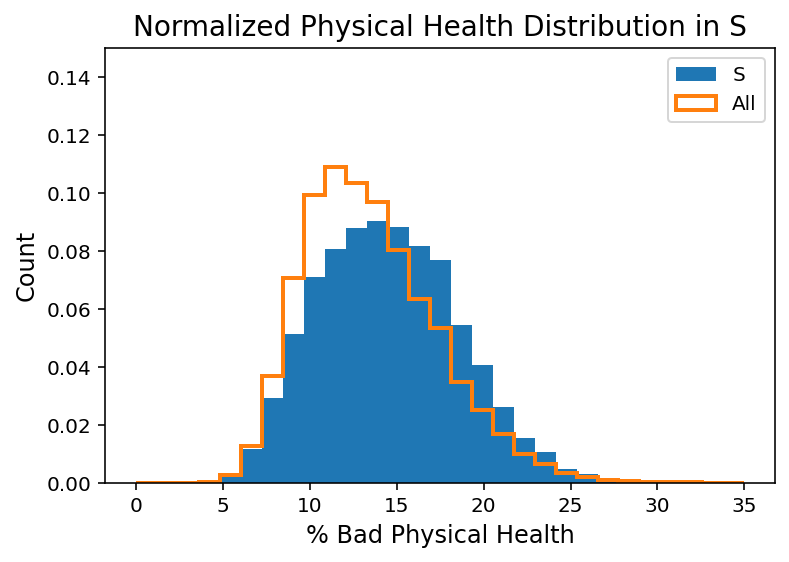

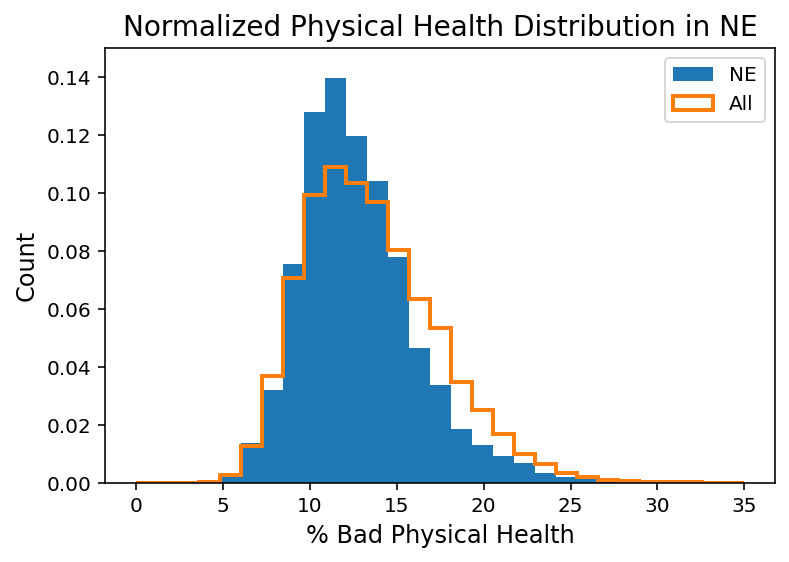

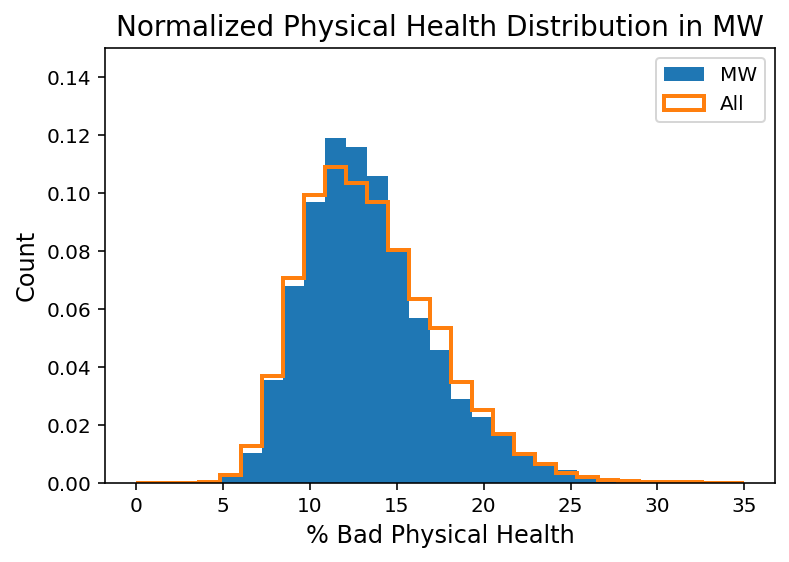

In [72]:
regions = finalDataset["regionInitials"].unique()
for region in regions:
    plt.hist(finalDataset[finalDataset["regionInitials"] == region]["badPhysicalHealth%"], density=True, bins=np.linspace(0, 35, 30), label=region)
    plt.hist(finalDataset["badPhysicalHealth%"], density=True, bins=np.linspace(0, 35, 30), label="All", histtype="step", linewidth=2)
    plt.title(f"Normalized Physical Health Distribution in {region}", fontsize=14)
    plt.xlabel("% Bad Physical Health", fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.legend()
    plt.ylim(0, 0.15)
    plt.show()

##### It appears to be that the regions have about the same distributions of physical health, but the south seems to be shifted right slightly and with a noticeable increase in standard deviation. Overall, the difference is relatively small.

##### Next, we can explore the correlation between race and health.



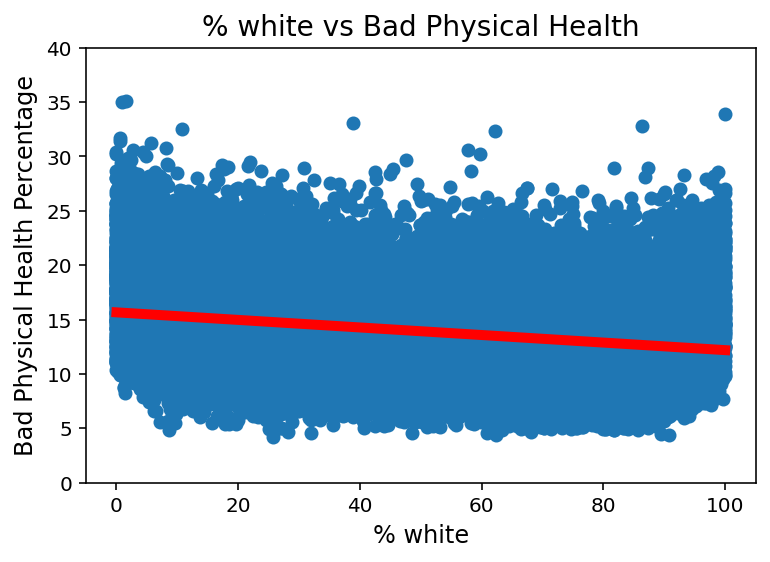

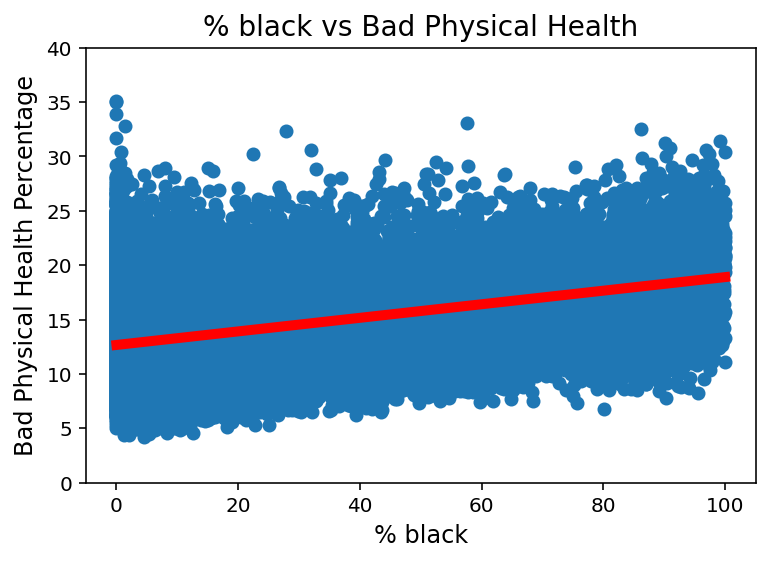

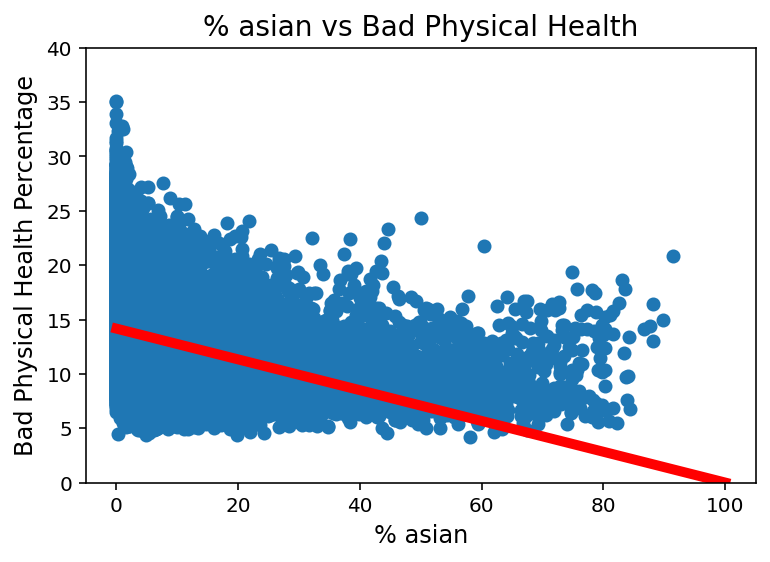

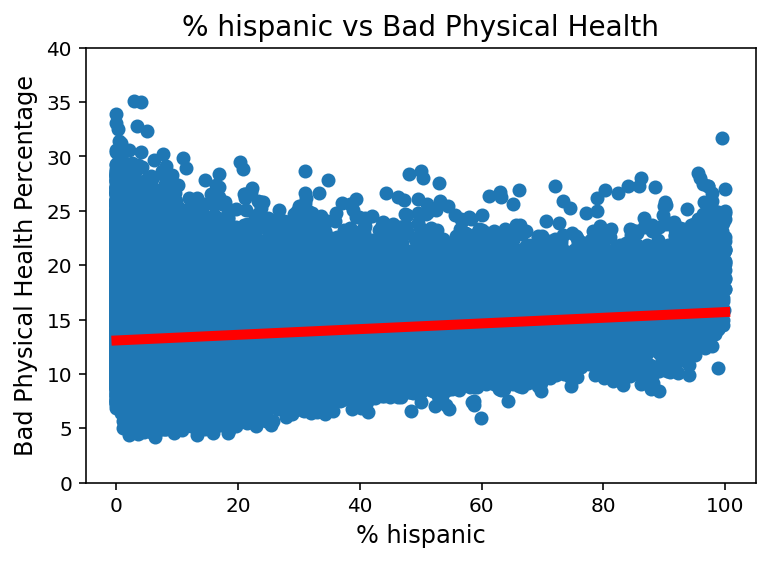

In [86]:
for race in ["white", "black", "asian", "hispanic"]:
    X = np.array(finalDataset[race])
    y = np.array(finalDataset["badPhysicalHealth%"])

    plt.scatter(X, y)
    plt.xlabel(f'% {race}', fontsize=12)
    plt.ylabel('Bad Physical Health Percentage', fontsize=12)
    plt.title(f'% {race} vs Bad Physical Health', fontsize=14)
    
    lm = sklearn.linear_model.LinearRegression()
    lm.fit(np.reshape(X, (-1, 1)), np.array(y))
    x_pred = np.linspace(0, 100, 100)
    y_pred = lm.predict(np.reshape(x_pred, (-1, 1)))
    
    plt.plot(x_pred, y_pred, color="red", linewidth=5)
    plt.ylim(0, 40)
    plt.show()

##### The first thing that stands out is the poorly fit line for the Asian plot. This looks like it's due to a combination of not enough datapoints and heteroskedastic data. Additionally, there appears to be only very small trends, which indicates that there isn't that strong of a correlation. It is notable, however, that there is a disturbing trend that an increase in % black is very linearly correlated with a decrease in physical health.

##### We can also start looking at education data



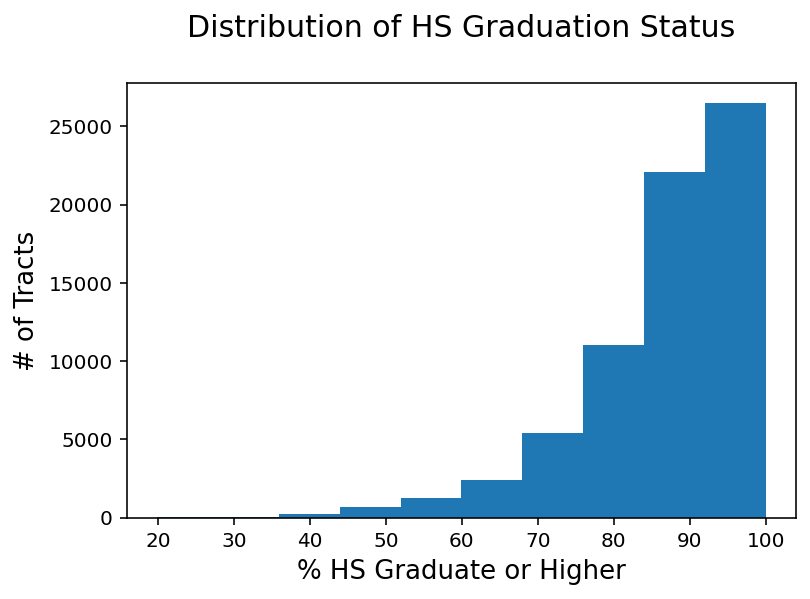

In [9]:
# Plot
plt.hist(finalDataset["%PercentHighSchoolGraduateOrHigher"])

# Formatting
plt.ylabel('# of Tracts',fontsize=13)
plt.xlabel('% HS Graduate or Higher',fontsize=13)
plt.title('Distribution of HS Graduation Status\n',fontsize=15)

plt.show()

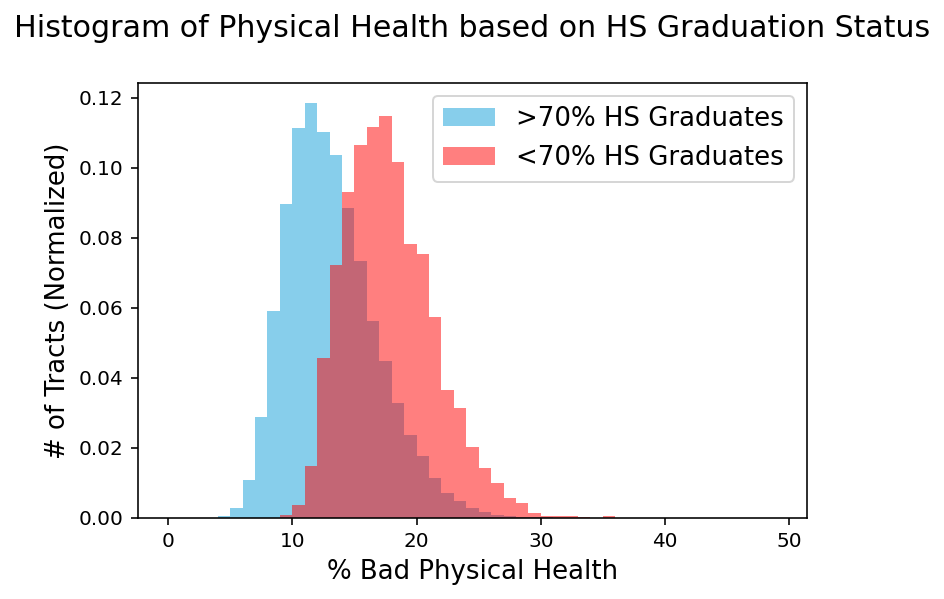

In [11]:
# Plot
plt.hist(finalDataset[finalDataset["%PercentHighSchoolGraduateOrHigher"]>=70]["badPhysicalHealth%"],bins=np.arange(0,50,1),label='>70% HS Graduates',color='Skyblue',density=True)
plt.hist(finalDataset[finalDataset["%PercentHighSchoolGraduateOrHigher"]<70]["badPhysicalHealth%"],bins=np.arange(0,50,1),label='<70% HS Graduates',color='Red', alpha=0.5,density=True)

# Formatting
plt.ylabel('# of Tracts (Normalized)',fontsize=13)
plt.xlabel('% Bad Physical Health',fontsize=13)
plt.title('Histogram of Physical Health based on HS Graduation Status\n',fontsize=15)
plt.legend(fontsize=13)

plt.show()

##### It looks like most tracts have high HS graduation rates, but those that have low graduation rates appear to have nearly double the rate of bad physical health.

##### Next, we can examine specific health indicators, such as diabetes percentage, arthritis percentage, depression, and more.



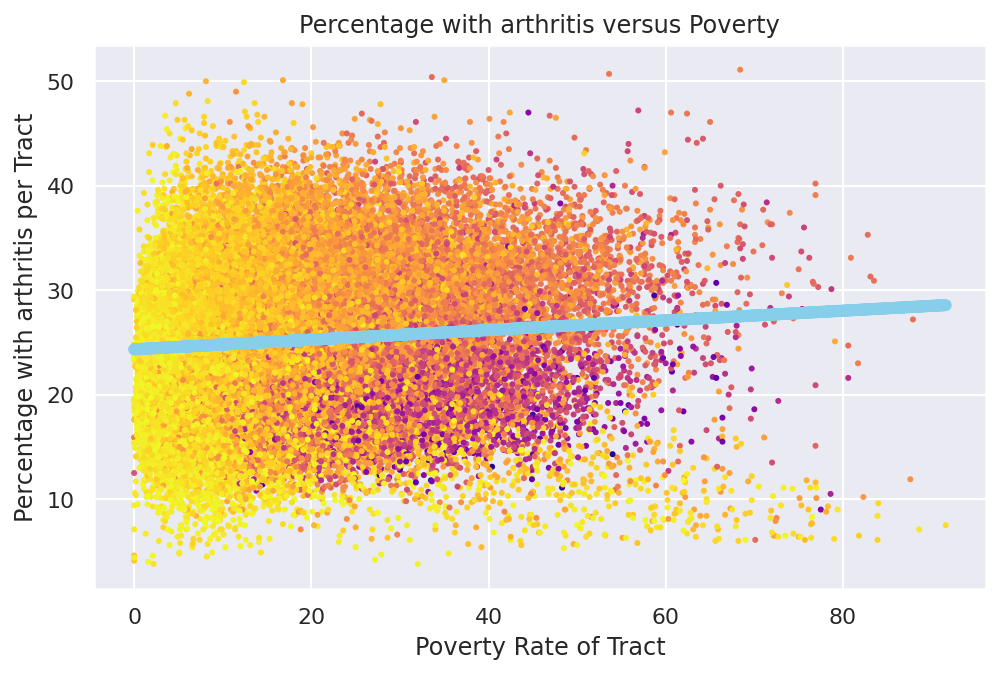

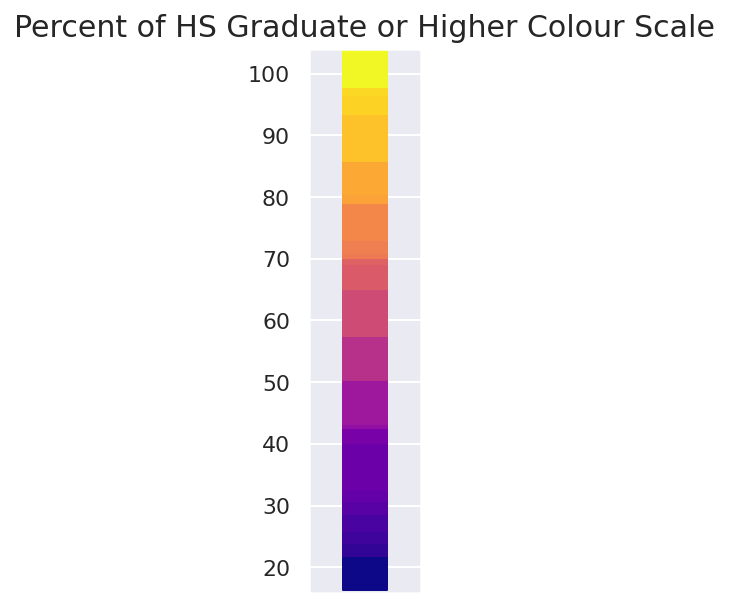

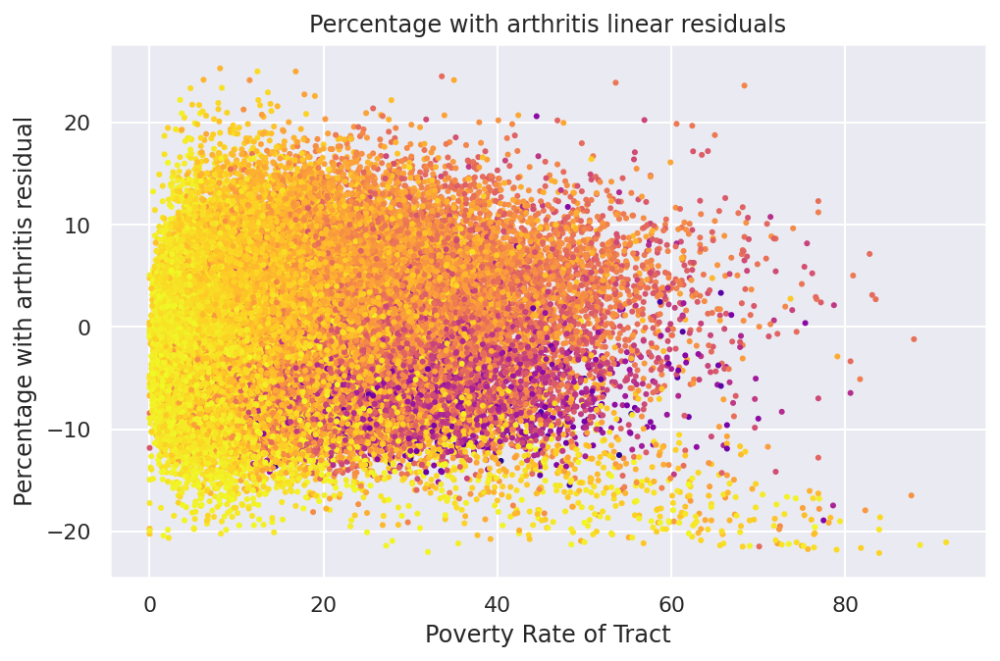

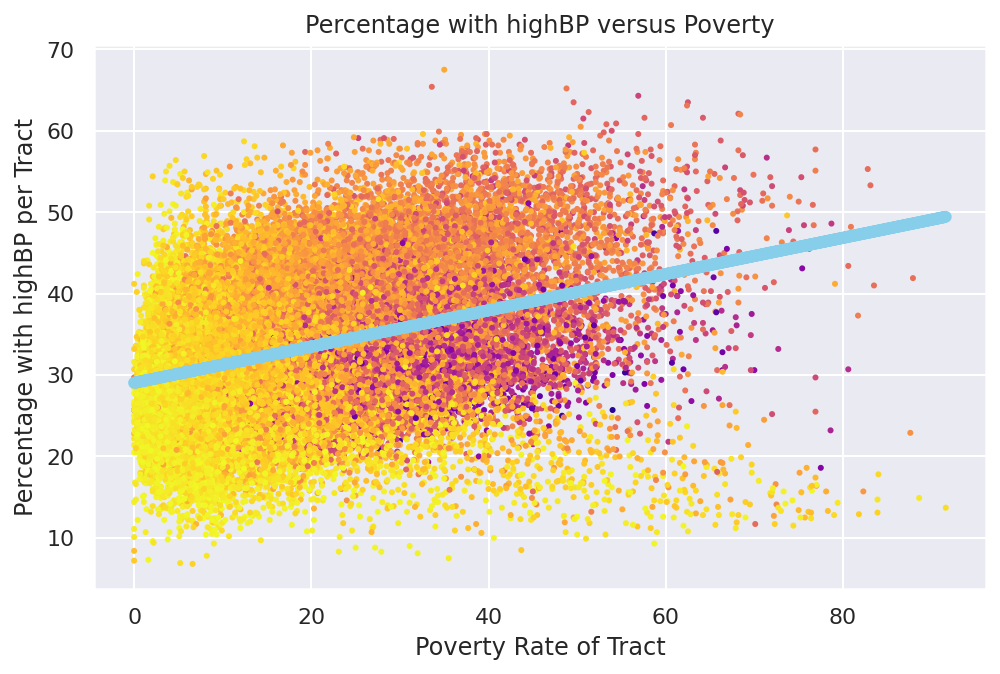

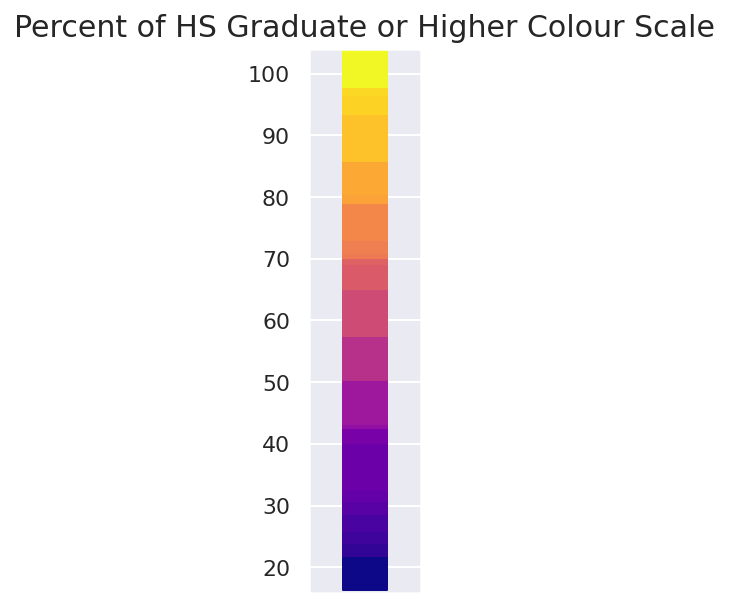

...

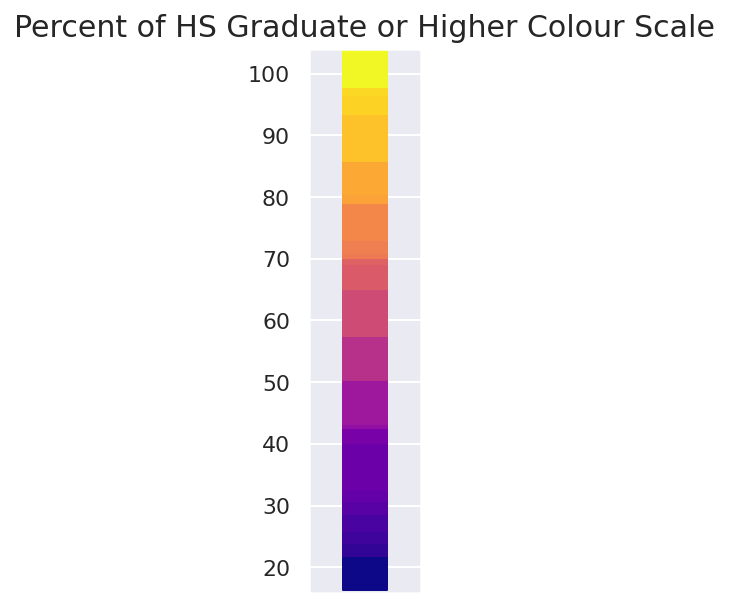

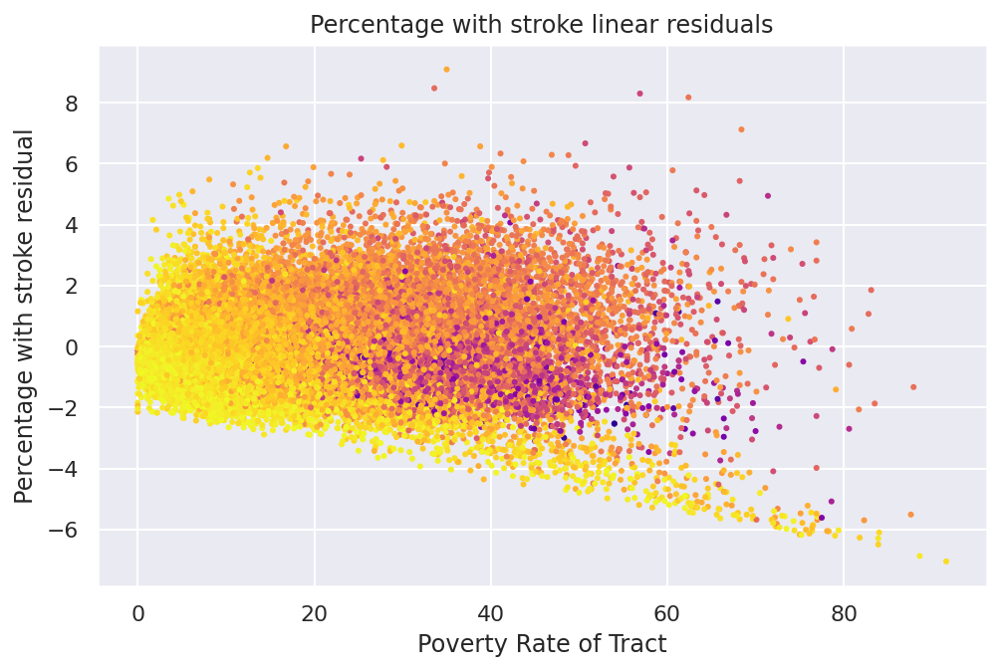

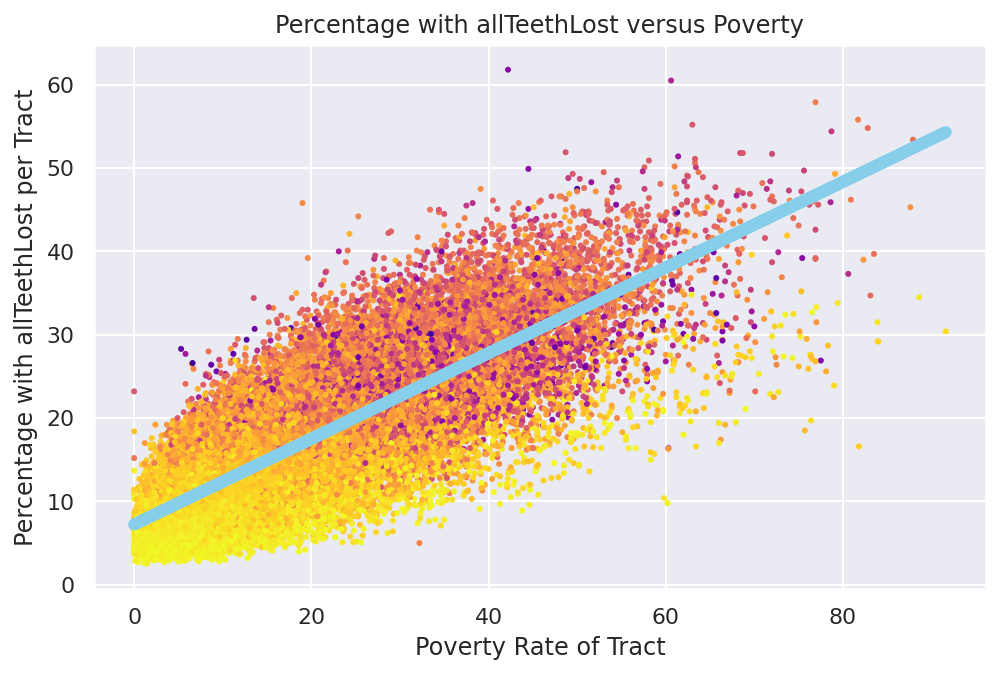

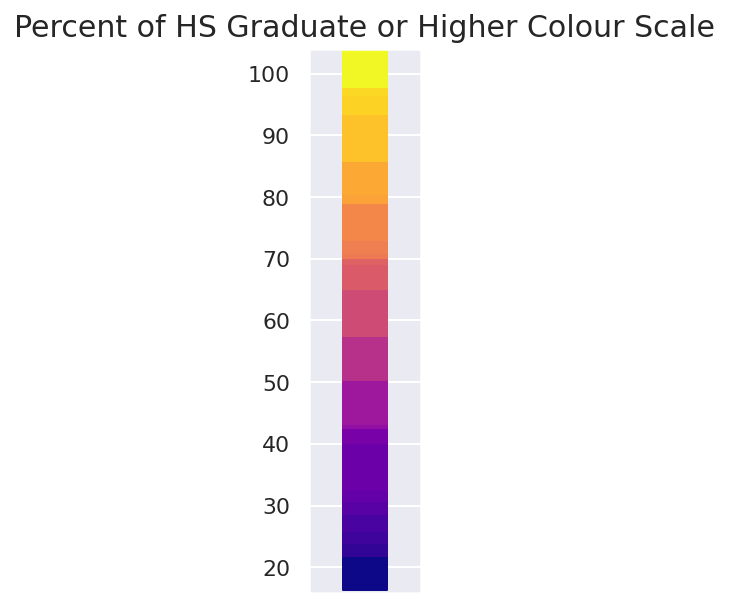

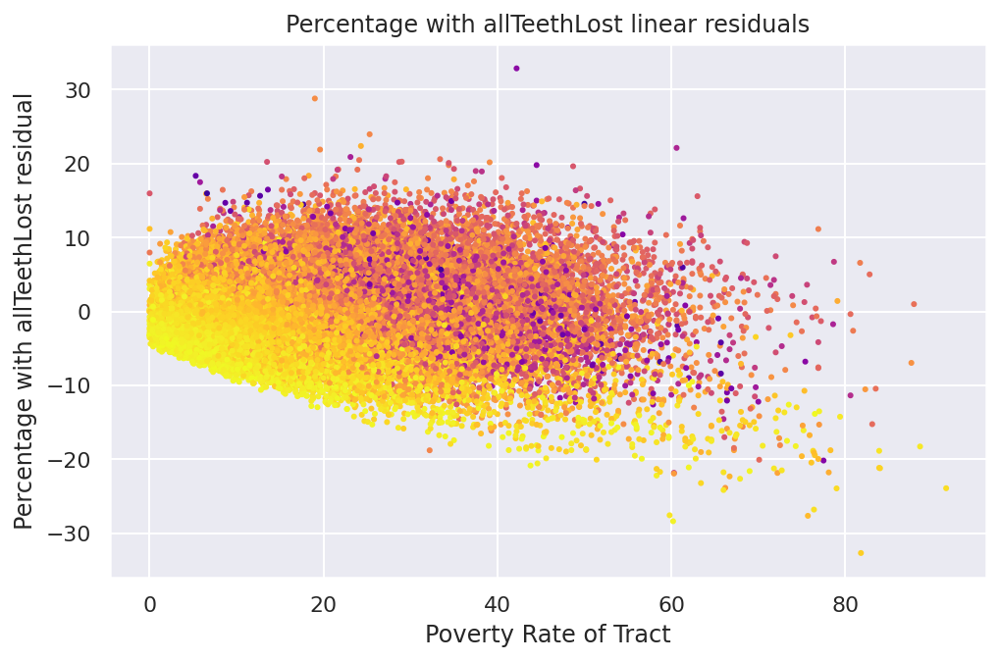

In [10]:
# Set graph size
sns.set(rc = {'figure.figsize':(8,5)})

# All Health Indicators against poverty and HS Graduation Status for Tract
for condition in ['arthritis%',
       'highBP%','nonSkinCancer%', 'currentAsthma%', 'coronaryHeartDisease%',
       'chronicObstructivePulmonaryDisease%', 'depression%', 'diabetes%', 'highCholestorol%', 'chronicKidneyDisease%',
       'badMentalHealth%', 'obesity%', 'badPhysicalHealth%','stroke%', 'allTeethLost%']:
    
    # fit line through data to give an idea of general trend
    lm = LinearRegression()
    lm.fit(finalDataset[['poverty']],finalDataset[condition])
    
    # Linear Regression Line for idea of General Trend
    plt.plot(finalDataset['poverty'], lm.predict(finalDataset[['poverty']]),c='SkyBlue',linewidth=6)
    
    # Scatter plot of Real Data
    plt.scatter(finalDataset['poverty'],finalDataset[condition], c=finalDataset["%PercentHighSchoolGraduateOrHigher"],cmap='plasma',s=4)
    plt.xlabel("Poverty Rate of Tract")
    plt.ylabel("Percentage with "+condition[:-1]+" per Tract")
    plt.title("Percentage with "+condition[:-1]+" versus Poverty")
    plt.show()
    
    # Plot scale to give meaning to the gradient of. each point... The yellower the points are, the more percentage of the tract graduating High School
    f = plt.figure()
    f.set_figwidth(1)
    f.set_figheight(5)
    plt.scatter(np.zeros_like(finalDataset["%PercentHighSchoolGraduateOrHigher"]),finalDataset["%PercentHighSchoolGraduateOrHigher"],c=finalDataset["%PercentHighSchoolGraduateOrHigher"],s=500,marker="s",cmap='plasma')
    plt.xticks([])
    plt.title('Percent of HS Graduate or Higher Colour Scale', fontsize=15)
    plt.show()
    
    # Plot residuals to help determine heteroskedacicity
    plt.scatter(finalDataset['poverty'], finalDataset[condition]-lm.predict(finalDataset[['poverty']]),c=finalDataset["%PercentHighSchoolGraduateOrHigher"],cmap='plasma',s=4)
    plt.xlabel("Poverty Rate of Tract")
    plt.ylabel(f"Percentage with {condition[:-1]} residual")
    plt.title(f"Percentage with {condition[:-1]} linear residuals")
    plt.show()

###### Taking the graphs one at a time:

- Arthritis doesn't seem to have much of a correlation outside of a weak positive correlation with poverty 
- High Blood Pressure with poverty rates and HS graduation rates seems to have a similar distribution of data to poverty, which is that there is not a ton of correlation
- Non Skin Cancer rates don't seem to be that affected by high school diploma attainment, but interestingly occur less frequently  when more people are below the poverty line. One potential explanation for this could be that poorer areas can't afford to be seen by a doctor, and thus the cancer goes undiagnosed and untreated. 
- There appears to be a positive correlation between asthma rates and poverty percentage, which may be attributed to the fact that dirtier living conditions have been proven to cause asthma.
- There appears to be a slight positive correlation between coronary heart disease and poverty.     
- \-\-\- SO FAR, A COMMON THEME IS THAT COMMUNITIES WITH LOW HIGH SCHOOL GRADUATION RATES AND HIGH POVERTY RATES HAVE WORSE OUTCOMES THAN THE OTHER TRACTS
- There appears to be a notable positive trend between poverty rate and Chronic Obstructive Pulmonary Disease
- There doesn't seem to be much of a correlation between poverty and high school completion, and Depression
- It seems that those with a high school education are less likely to get diabetes, but as poverty increases, the clusters of having a lot of high school graduates and not are differentiated quite noticeably
- There seems to be no correlation between High Cholesterol and poverty or high school graduation status 
- There seems to be two major clusters of data, ones with high levels of high school educations and low levels. The higher levels of HS educations seem to lower the chance of chronic kidney disease.
- It seems that there is a very strong, homoskedastic relationship between poverty and the percentage of mental health issues.
- There seems to be a notably strong relationship between obesity and poverty.
- Akin to the diabetes correlation, having more people high school educated mitigates the effect of poverty  on bad physical health percentage
- There is a moderately strong correlation between poverty and stroke percentage, but tracts with more people with high school educations seem to have a lot less prevalence of stroke
- There is a very strong correlation between poverty and the percentage of the population that lost all of their teeth



##### We can also test out a pair of variables that we intuitively assumed would have a good correlation and make sure that there is no heteroskedasticity.



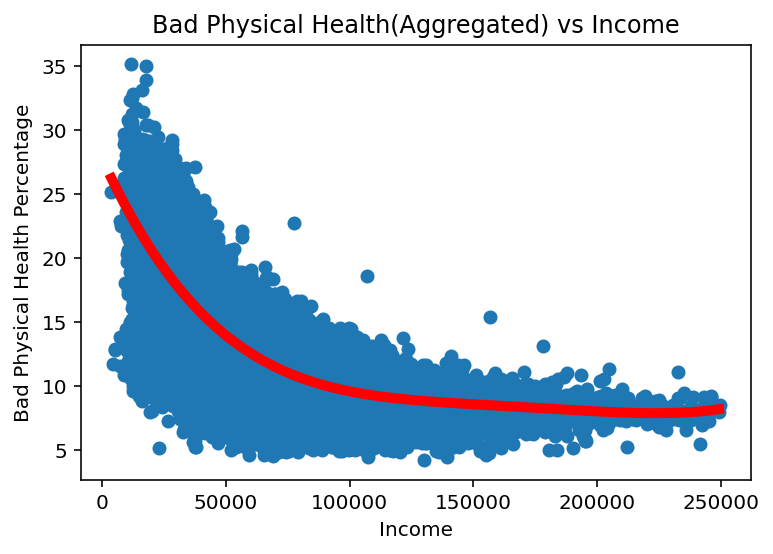

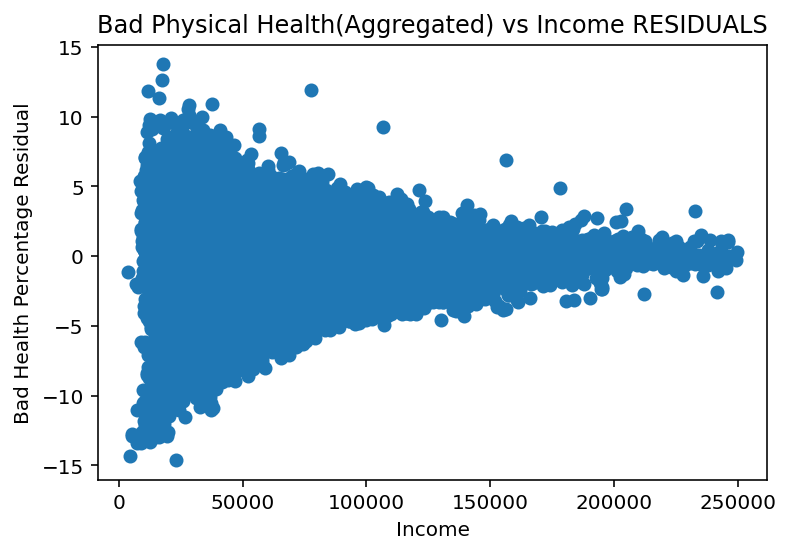

In [23]:
plt.scatter(finalDataset['income'],finalDataset['badPhysicalHealth%'])
plt.xlabel('Income')
plt.ylabel('Bad Physical Health Percentage')
plt.title('Bad Physical Health(Aggregated) vs Income')

X = np.array(finalDataset['income'])
y = finalDataset['badPhysicalHealth%']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)
pm = np.polyfit(X_train, y_train, 4)

x_linspace = np.linspace(min(X_train), max(X_train), 100)
y_linspace = [np.polyval(pm, x) for x in x_linspace]
plt.plot(x_linspace, y_linspace, color="red", linewidth=5)
plt.show()

y_pred = np.array([np.polyval(pm, x) for x in X])
plt.scatter(X, np.array(y)-y_pred)
plt.title("Bad Physical Health(Aggregated) vs Income RESIDUALS")
plt.xlabel("Income")
plt.ylabel("Bad Health Percentage Residual")
plt.show()

##### Although the curve seems to fit pretty well, the residuals show that this relationship is actually extremely heteroskedastic. This means we need to find some way to determine with variables are actually good without needing to look at alot of graphs again.



##### In order to see which factors are truly the most important, we will make a Decision Tree model, and set the depth small enough that the model is easily interpretable. This will allow us to evaluate models more clearly.



In [90]:
# Set up common inputs for the models to choose from
X_cols = ['noHealthInsurance%', 'men', 'women', 'hispanic', 'white', 'black', 'native',
       'asian', 'pacific','incomePerCap', 'poverty', 'childPoverty',
       'professional', 'service', 'office', 'construction', 'production',
       'drive', 'carpool', 'transit', 'walk', 'otherTransp', 'workAtHome',
       'meanCommute', 'employed', 'privateWork', 'publicWork', 'selfEmployed',
       'familyWork', 'unemployment', '%LessThan9thGrade',
       '%HighSchoolGraduate', '%SomeCollege,NoDegree', '%AssociatesDegree',
       '%BachelorsDegree', '%GraduateOrProfessionalDegree',
       '%PercentHighSchoolGraduateOrHigher', '%PercentBachelorsDegreeOrHigher',
       '%PovertyLessThanHighSchoolGraduate', '%PovertyHighSchoolGraduate',
       '%PovertySomeCollegeOrAssociatesDegree',
       '%PovertyBachelorsDegreeOrHigher']
y_cols = ['stroke%', 'depression%',
          'highBP%', 'nonSkinCancer%', 'currentAsthma%',
          'arthritis%', 'cervicalCancer%', 'coronaryHeartDisease%',
          'chronicObstructivePulmonaryDisease%',
          'diabetes%',
          'highCholestorol%', 'chronicKidneyDisease%',
          'obesity%', 'allTeethLost%',
          'badMentalHealth%', 'badPhysicalHealth%']

X = finalDataset[X_cols]
y_all = [finalDataset[col] for col in y_cols]

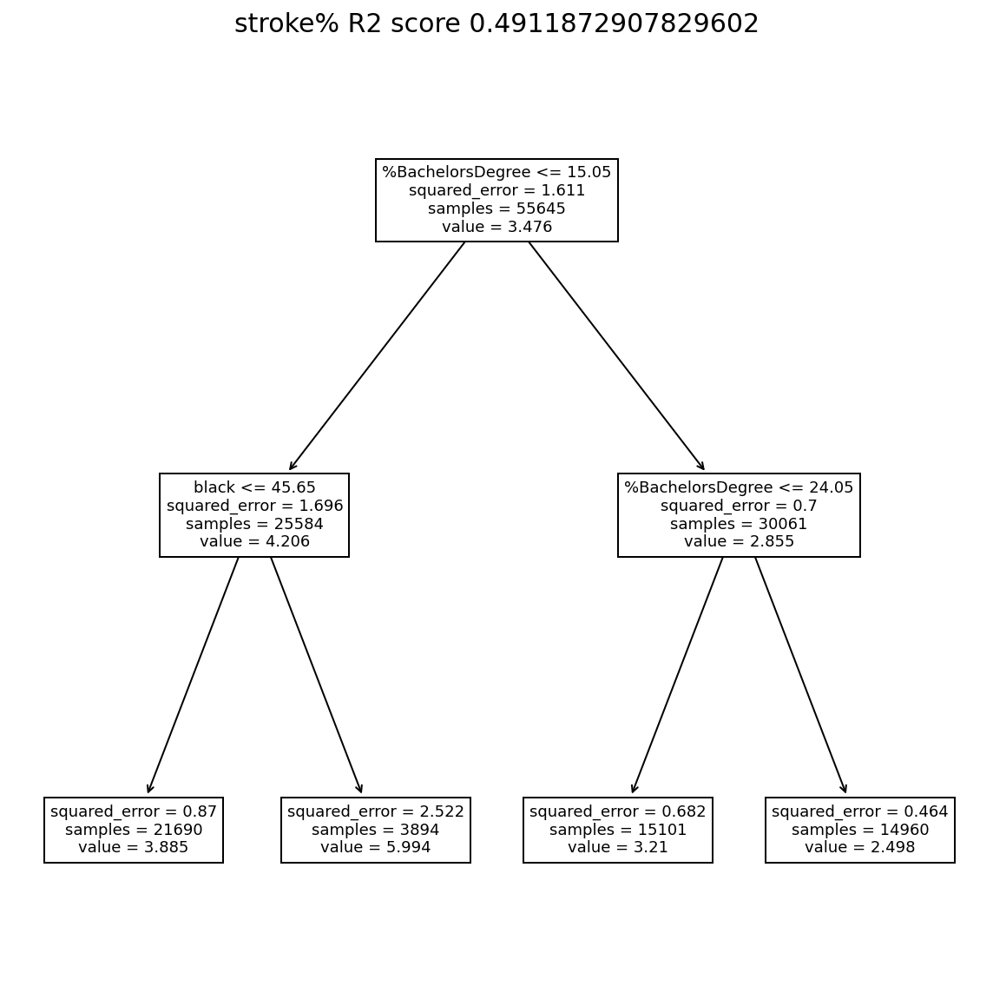

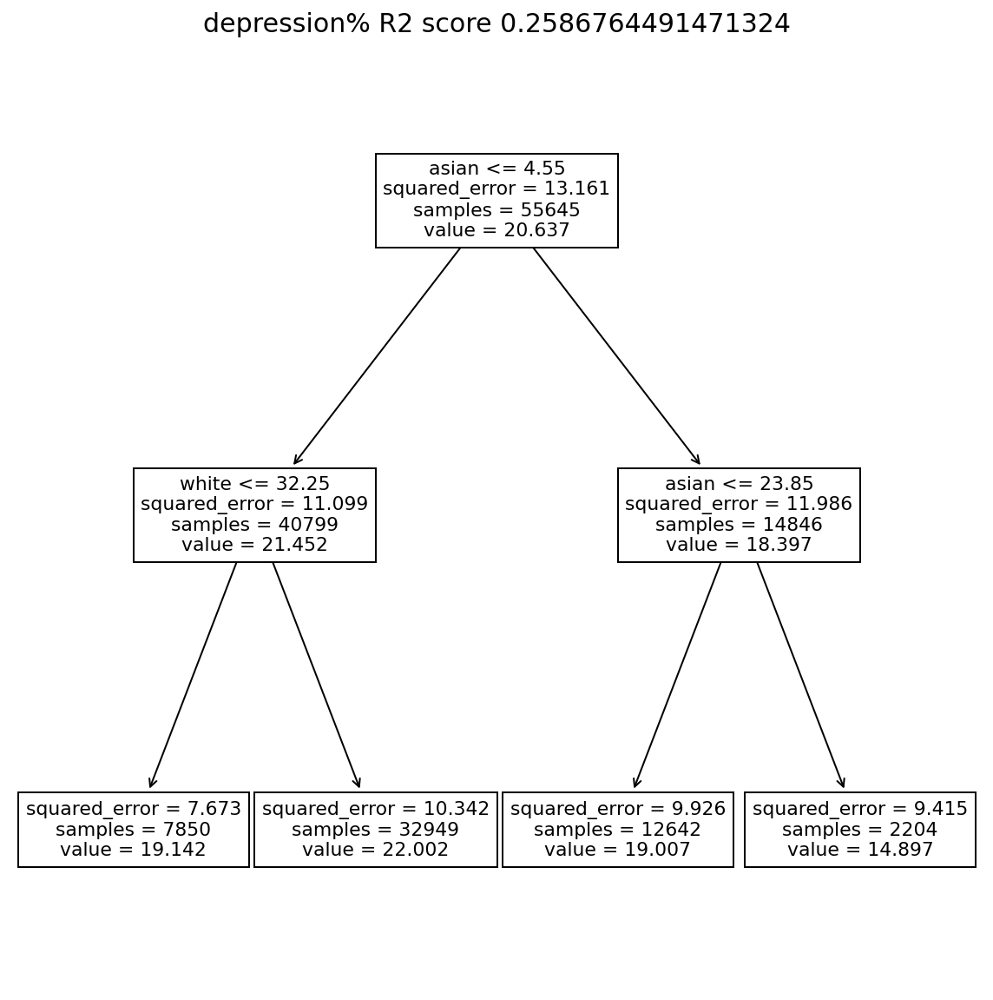

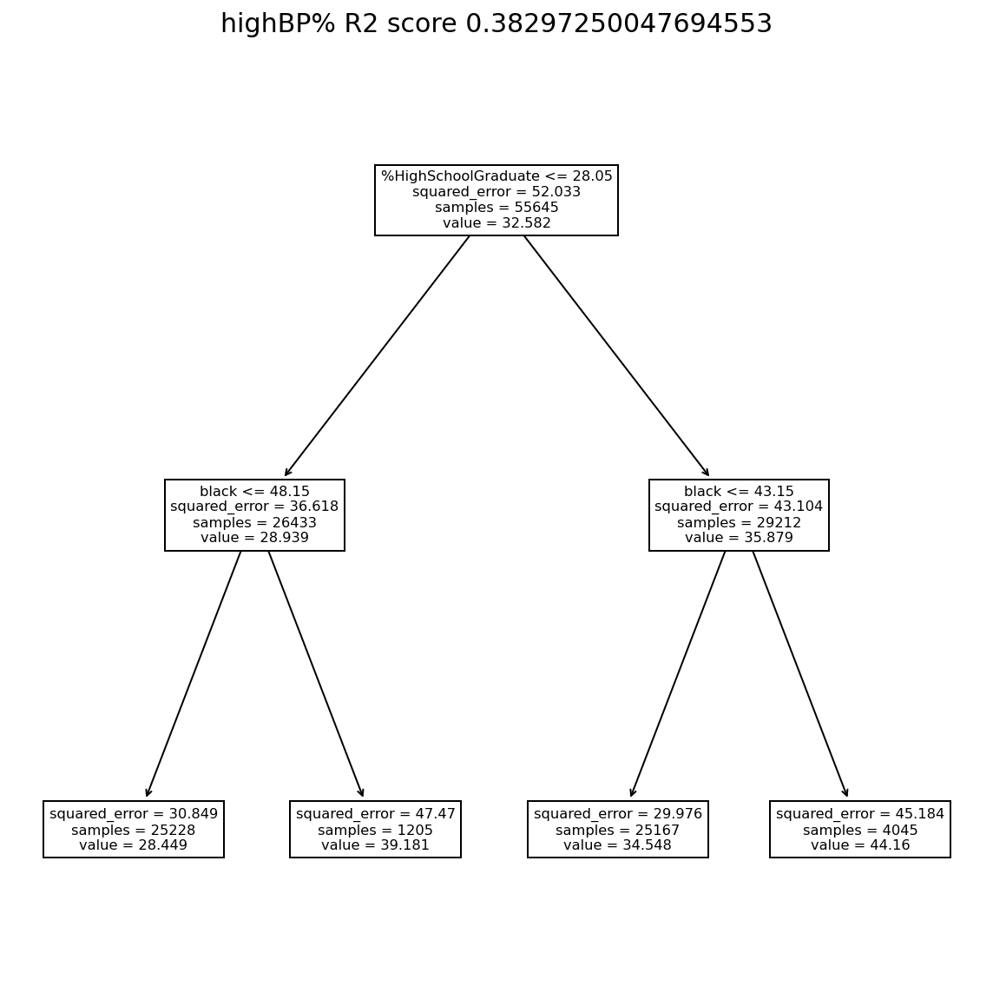

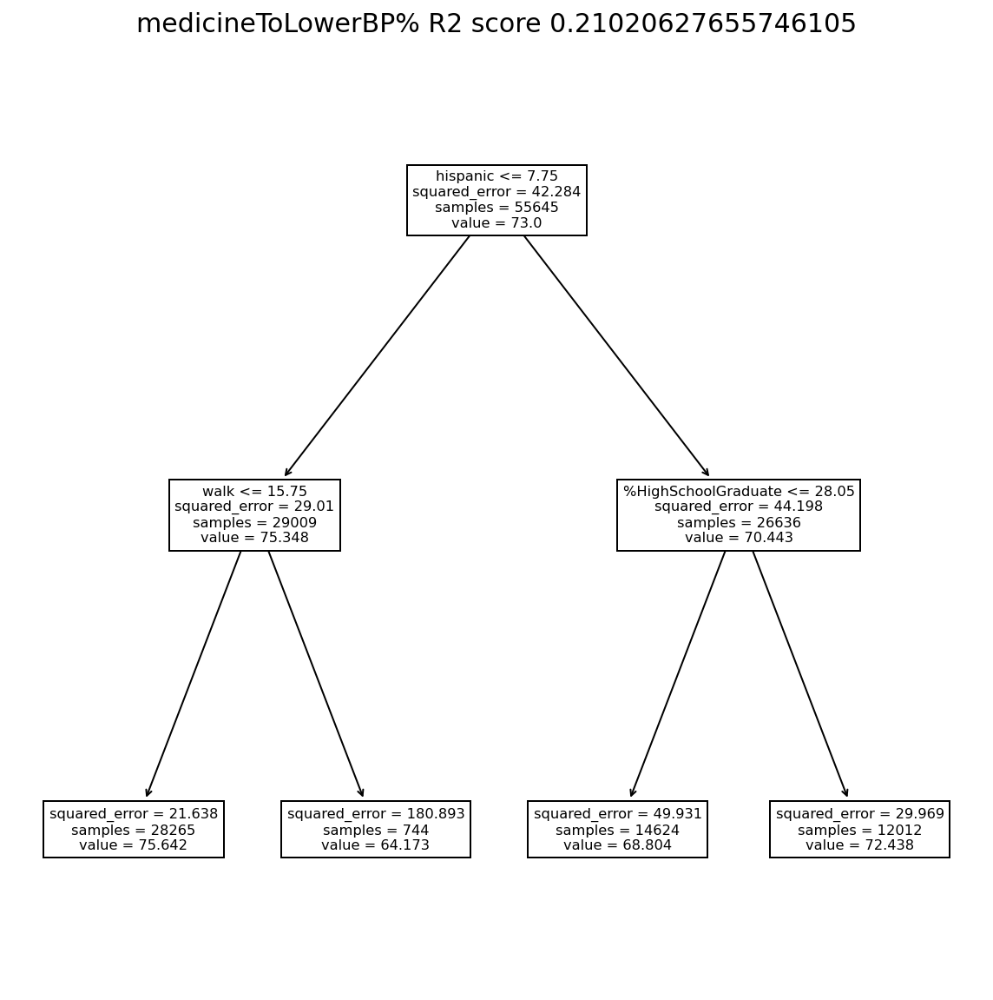

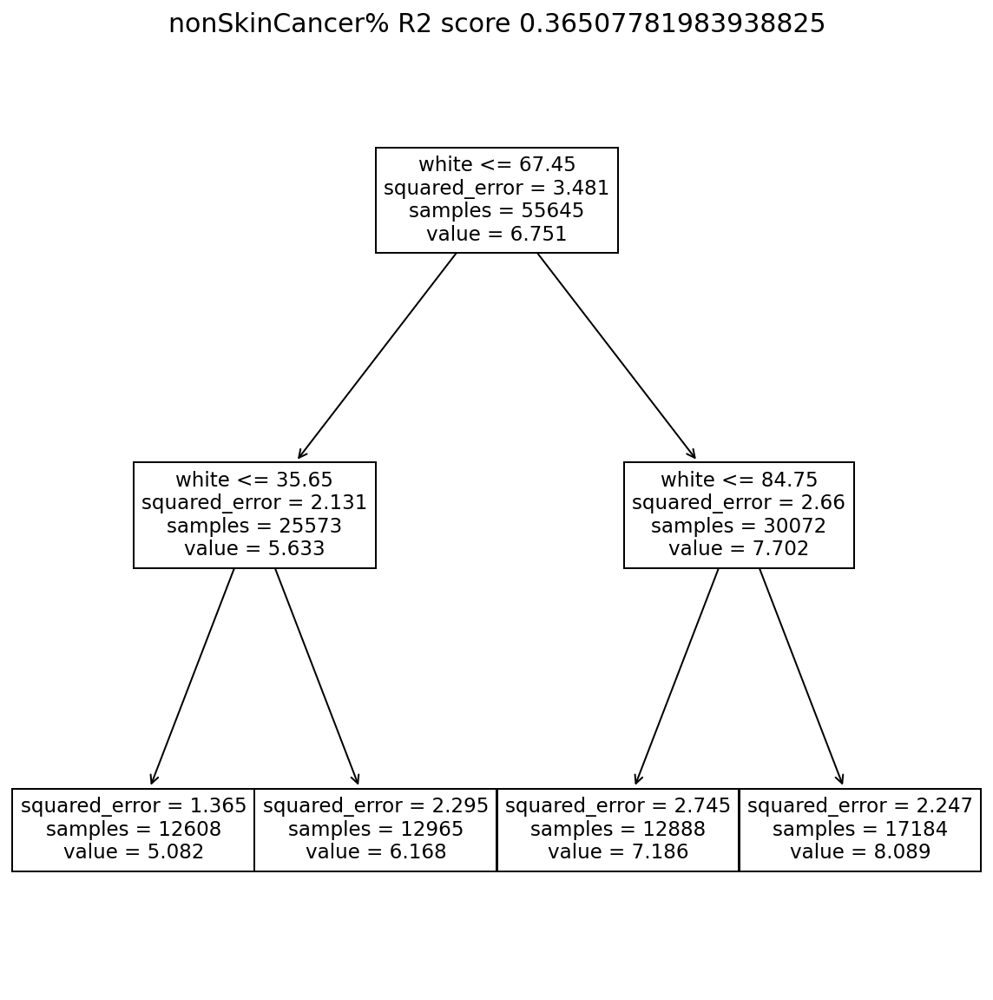

...

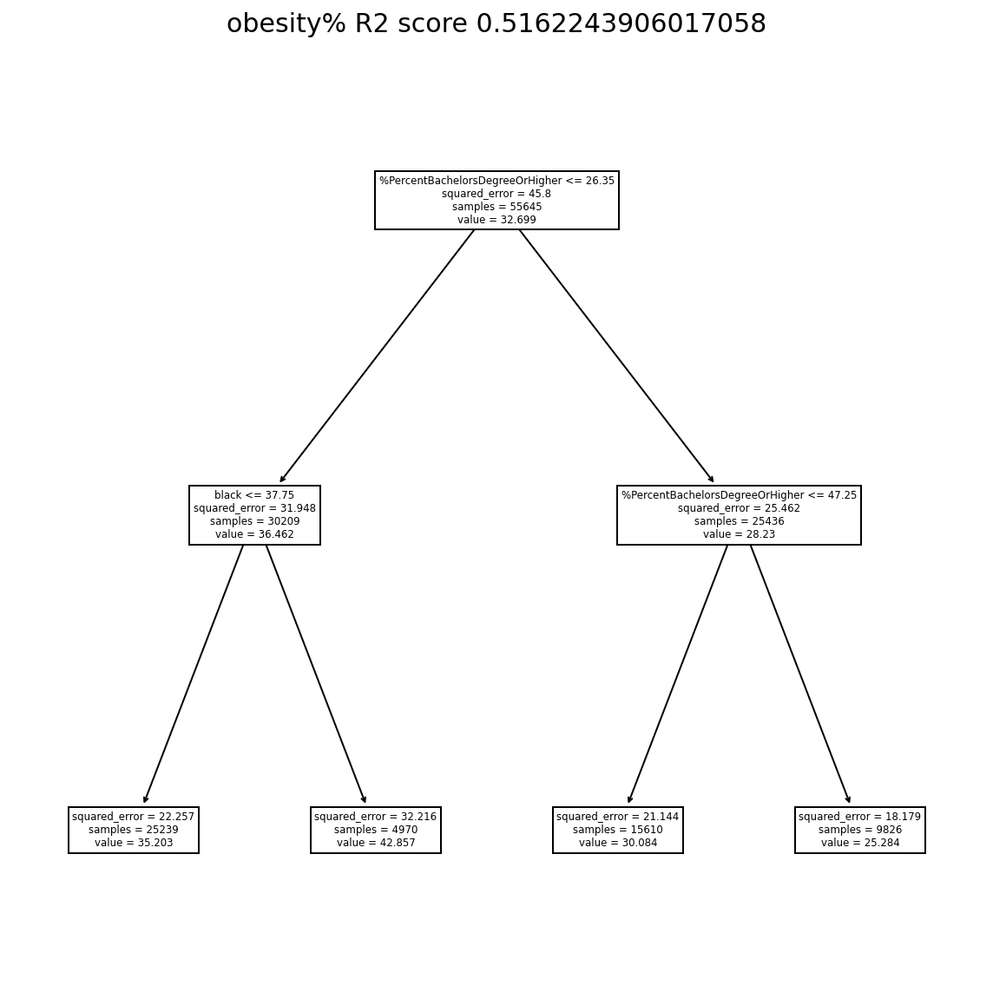

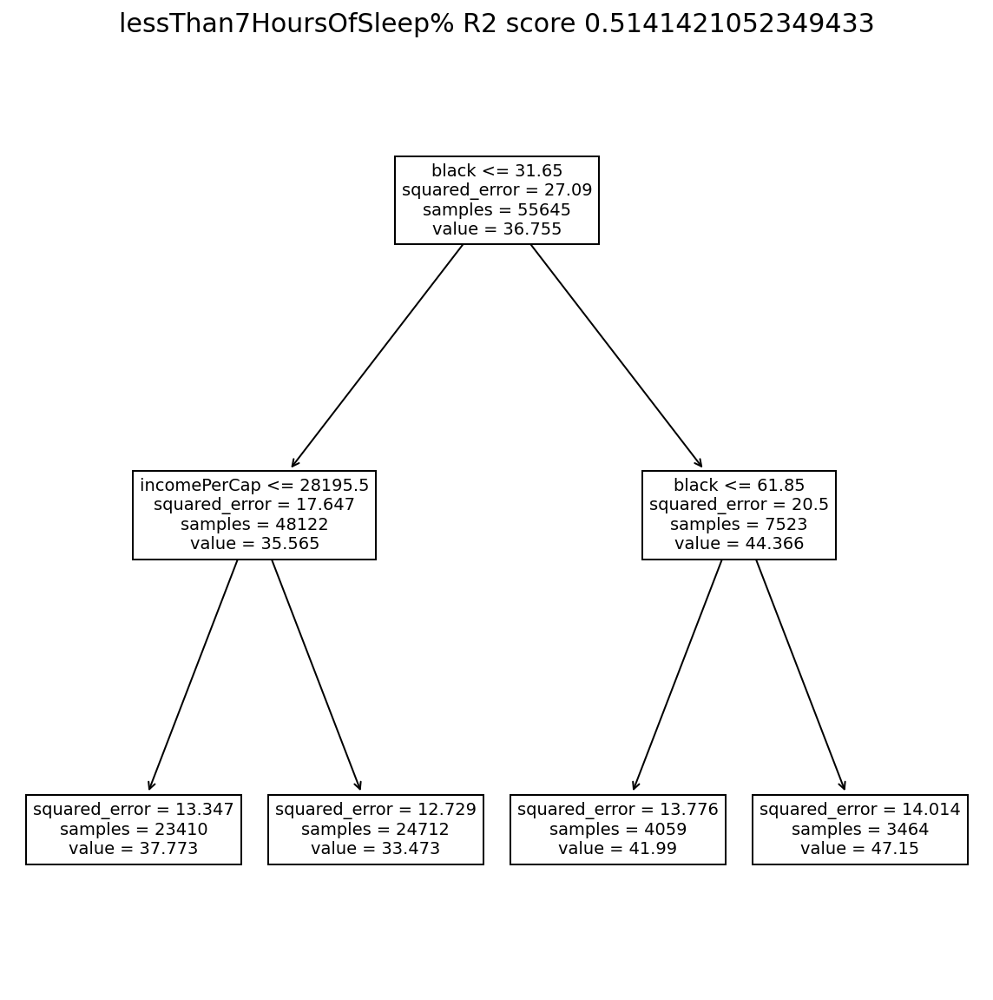

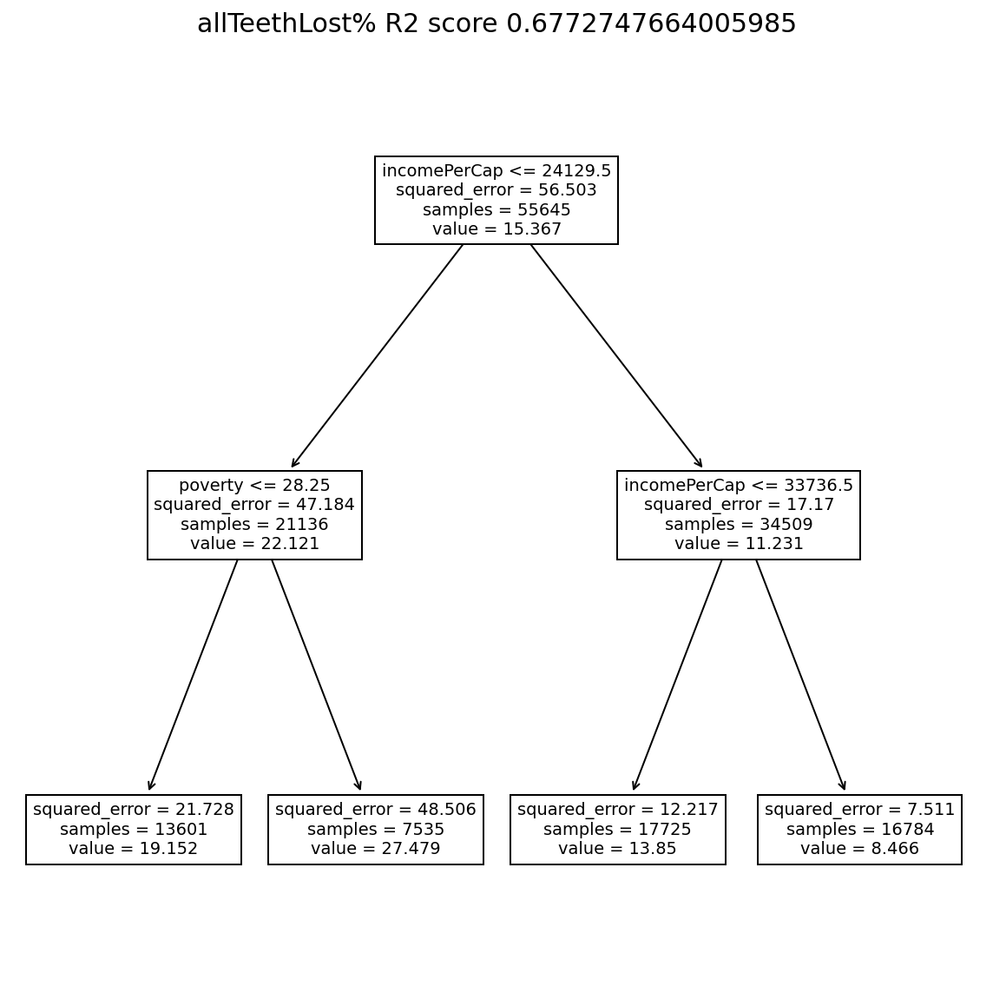

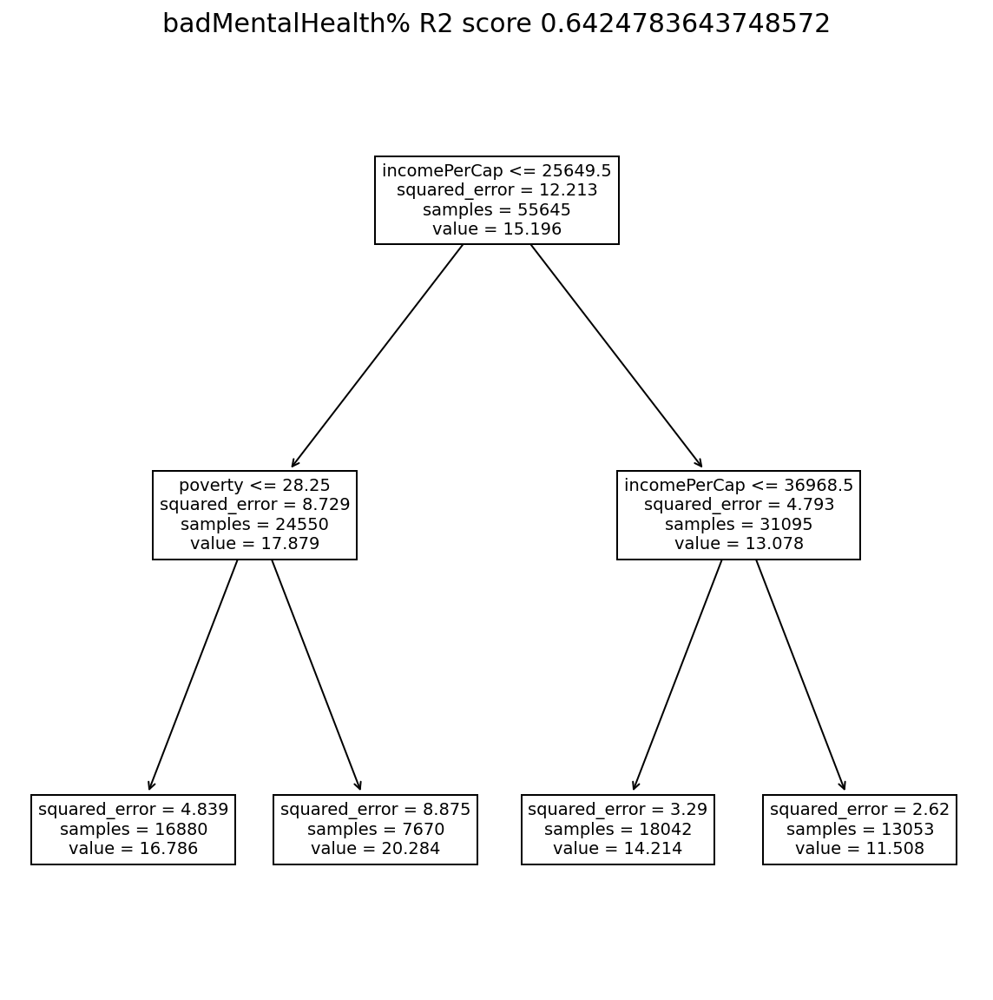

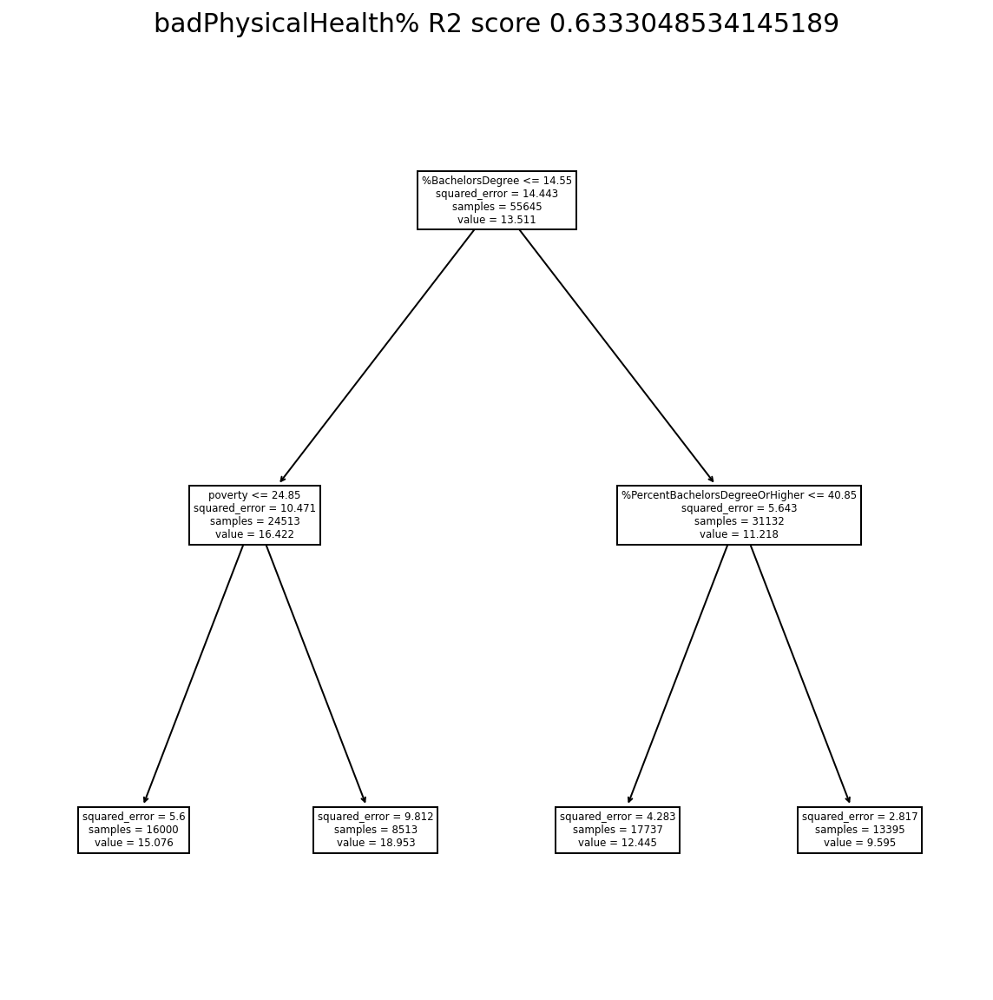

In [30]:
for healthIndicator in y_cols:
    dtr = DecisionTreeRegressor(max_depth = 2)

    Xtrain,Xtest,Ytrain,Ytest = train_test_split(X, finalDataset[healthIndicator], test_size=0.2, random_state=11)

    dtr.fit(Xtrain,Ytrain)
    fig = plt.figure(figsize=(10, 10))

    plot_tree(dtr,feature_names=['noHealthInsurance%', 'men', 'women', 'hispanic', 'white', 'black', 'native',
       'asian', 'pacific','incomePerCap', 'poverty', 'childPoverty',
       'professional', 'service', 'office', 'construction', 'production',
       'drive', 'carpool', 'transit', 'walk', 'otherTransp', 'workAtHome',
       'meanCommute', 'employed', 'privateWork', 'publicWork', 'selfEmployed',
       'familyWork', 'unemployment', '%LessThan9thGrade',
       '%HighSchoolGraduate', '%SomeCollege,NoDegree', '%AssociatesDegree',
       '%BachelorsDegree', '%GraduateOrProfessionalDegree',
       '%PercentHighSchoolGraduateOrHigher', '%PercentBachelorsDegreeOrHigher',
       '%PovertyLessThanHighSchoolGraduate', '%PovertyHighSchoolGraduate',
       '%PovertySomeCollegeOrAssociatesDegree',
       '%PovertyBachelorsDegreeOrHigher'])
    plt.title(healthIndicator+" R2 score " + str(dtr.score(Xtest,Ytest)),fontsize=15)
    plt.show()

##### The results are surprisingly good for aggregate measures like badMentalHealth% \(R2 of 0.642\) and badPhysicalHealth% \(R2 of 0.633\) but also quite bad for more specific measures like depression% \(R2 of 0.259\). Now that we know that the models tend not be racist\(as our previous exploration showed that race shouldn't correlate very much\), we can see how far we can push the trees before they overfit.



In [31]:
# Returns list where all values are scaled to be in [0, 1]
def normalize_list(l):
    l = np.array(l)
    l = l - min(l)
    l = l / max(l)
    return l

  0%|          | 0/21 [00:00<?, ?it/s]

  5%|▍         | 1/21 [00:25<08:33, 25.68s/it]

 10%|▉         | 2/21 [00:53<08:32, 26.96s/it]

 14%|█▍        | 3/21 [01:19<07:54, 26.39s/it]

 19%|█▉        | 4/21 [01:46<07:33, 26.66s/it]

 24%|██▍       | 5/21 [02:12<07:06, 26.65s/it]

 29%|██▊       | 6/21 [02:39<06:41, 26.75s/it]

 33%|███▎      | 7/21 [03:08<06:23, 27.41s/it]

 38%|███▊      | 8/21 [03:33<05:47, 26.74s/it]

 43%|████▎     | 9/21 [04:01<05:24, 27.03s/it]

 48%|████▊     | 10/21 [04:26<04:50, 26.45s/it]

 52%|█████▏    | 11/21 [04:53<04:24, 26.47s/it]

 57%|█████▋    | 12/21 [05:20<04:00, 26.71s/it]

 62%|██████▏   | 13/21 [05:48<03:36, 27.02s/it]

 67%|██████▋   | 14/21 [06:12<03:02, 26.07s/it]

 71%|███████▏  | 15/21 [06:38<02:37, 26.28s/it]

 76%|███████▌  | 16/21 [07:03<02:09, 25.80s/it]

 81%|████████  | 17/21 [07:28<01:41, 25.44s/it]

 86%|████████▌ | 18/21 [07:56<01:18, 26.16s/it]

 90%|█████████ | 19/21 [08:24<00:53, 26.84s/it]

 95%|█████████▌| 20/21 [08:51<00:27, 27.00s/it]

100%|██████████| 21/21 [09:16<00:00, 26.36s/it]

100%|██████████| 21/21 [09:16<00:00, 26.51s/it]

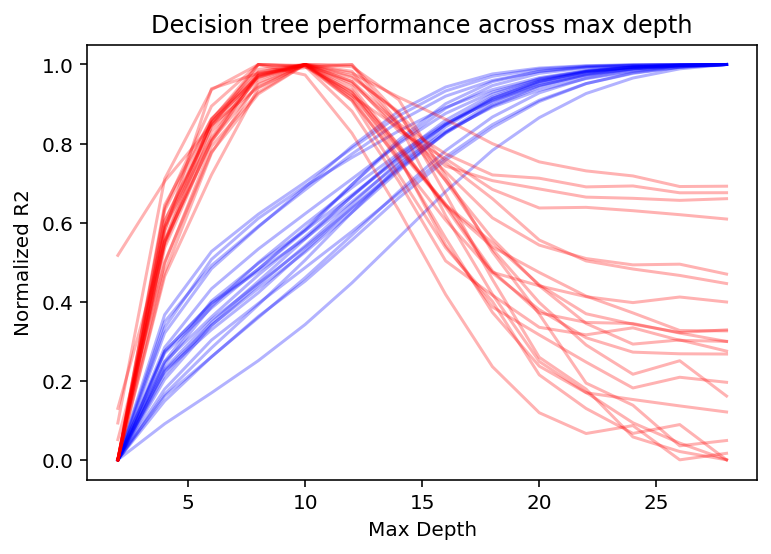

In [20]:
# Setup
depth_options = np.arange(2, 30, 2)
all_train_scores = []
all_test_scores = []

# Predict all health outcomes again
for col in tqdm(y_cols):
    # Set up variables
    y = finalDataset[col]
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

    # Set up graph X and y
    train_scores = []
    test_scores = []

    # Test all depths and record scores
    for depth in depth_options:
        rfr = DecisionTreeRegressor(max_depth=depth)
        rfr.fit(X_train, y_train)
        train_scores.append(rfr.score(X_train, y_train))
        test_scores.append(rfr.score(X_test, y_test))

    # Normalize and record scores across depths
    all_train_scores.append(normalize_list(train_scores))
    all_test_scores.append(normalize_list(test_scores))

# Plot Training
for scores in all_train_scores:
    plt.plot(depth_options, scores, c="blue", alpha=0.3)

# Plot Testing
for scores in all_test_scores:
    plt.plot(depth_options, scores, c="red", alpha=0.3)

# Formatting
plt.title("Decision tree performance across max depth")
plt.xlabel("Max Depth")
plt.ylabel("Normalized R2")
plt.show()

# Blue is training accuracy, red is testing accuracy

##### There is a very clear peak in testing accuracy in all the models that occurs around a max depth of 10. As the model increases in complexity past that point, the testing accuracy has a steep dropoff while the training accuracy continues to increase.

##### Since the tree model still shows significant room to grow at its peak, we can try using random forests to fight overfitting.



  0%|          | 0/21 [00:00<?, ?it/s]

  5%|▍         | 1/21 [00:59<19:55, 59.76s/it]

 10%|▉         | 2/21 [01:52<17:35, 55.54s/it]

 14%|█▍        | 3/21 [02:45<16:21, 54.54s/it]

 19%|█▉        | 4/21 [03:45<15:59, 56.44s/it]

 24%|██▍       | 5/21 [04:45<15:26, 57.88s/it]

 29%|██▊       | 6/21 [05:44<14:35, 58.38s/it]

 33%|███▎      | 7/21 [06:41<13:27, 57.67s/it]

 38%|███▊      | 8/21 [07:35<12:18, 56.79s/it]

 43%|████▎     | 9/21 [08:28<11:05, 55.48s/it]

 48%|████▊     | 10/21 [09:22<10:04, 54.95s/it]

 52%|█████▏    | 11/21 [10:19<09:17, 55.76s/it]

 57%|█████▋    | 12/21 [11:13<08:15, 55.10s/it]

 62%|██████▏   | 13/21 [12:10<07:25, 55.63s/it]

 67%|██████▋   | 14/21 [13:04<06:25, 55.14s/it]

 71%|███████▏  | 15/21 [13:55<05:24, 54.02s/it]

 76%|███████▌  | 16/21 [14:46<04:24, 52.97s/it]

 81%|████████  | 17/21 [15:35<03:27, 51.93s/it]

 86%|████████▌ | 18/21 [16:25<02:33, 51.16s/it]

 90%|█████████ | 19/21 [17:13<01:40, 50.27s/it]

 95%|█████████▌| 20/21 [18:03<00:50, 50.12s/it]

100%|██████████| 21/21 [18:59<00:00, 51.99s/it]

100%|██████████| 21/21 [18:59<00:00, 54.26s/it]

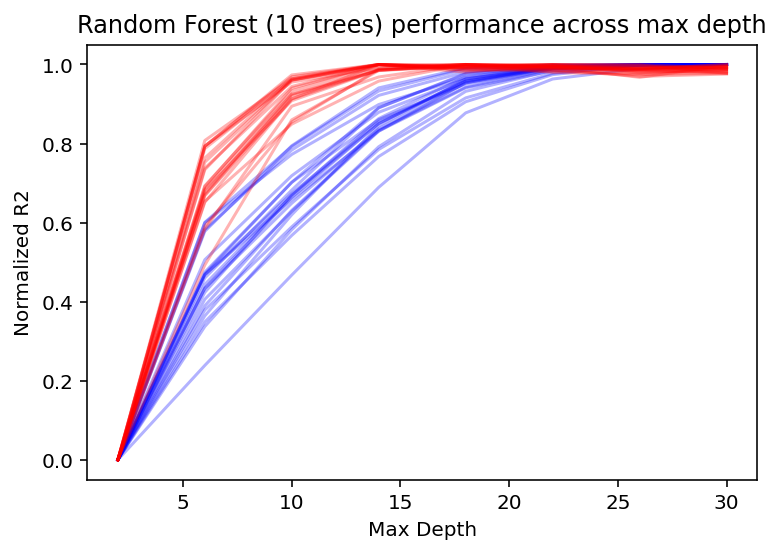

In [36]:
# Setup
depth_options = np.arange(2, 31, 4)
all_train_scores = []
all_test_scores = []

# Predict all health outcomes again
for col in tqdm(y_cols):
    # Set up variables
    y = finalDataset[col]
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

    # Set up graph X and y
    train_scores = []
    test_scores = []

    # Test all depths and record scores
    for depth in depth_options:
        forest = RandomForestRegressor(max_depth=depth, n_estimators=10, n_jobs=-1)
        forest.fit(X_train, y_train)
        train_scores.append(forest.score(X_train, y_train))
        test_scores.append(forest.score(X_test, y_test))

    # Normalize and record scores across depths
    all_train_scores.append(normalize_list(train_scores))
    all_test_scores.append(normalize_list(test_scores))

# Plot Training
for scores in all_train_scores:
    plt.plot(depth_options, scores, c="blue", alpha=0.3)

# Plot Testing
for scores in all_test_scores:
    plt.plot(depth_options, scores, c="red", alpha=0.3)

# Formatting
plt.title("Random Forest (10 trees) performance across max depth")
plt.xlabel("Max Depth")
plt.ylabel("Normalized R2")
plt.show()

# Blue is training accuracy, red is testing accuracy

##### Here, we can see a completely different trend, where testing accuracy seems to hold constant as the max depth is increased. The peak performance for this model is noticeably shifted to a point of higher complexity without showing signs of significant overfitting.

##### Now that we know how far we can push each model, we can validate that they haven't been getting lucky train\-test splits and that they are indeed generalizing a trend with cross\-validation.



In [12]:
def best_cross_model(model, X_train, y_train, X_test, y_test, k):
    estimators = cross_validate(model, X_train, y_train, cv=k, return_estimator=True, n_jobs=-1)["estimator"]
    scores = [estimator.score(X_test, y_test) for estimator in estimators]
    best_score = scores[0]
    best_i = 0
    for i, score in enumerate(scores[1:]):
        if score > best_score:
            best_i = i+1
            best_score = score
    return estimators[best_i], best_score, scores

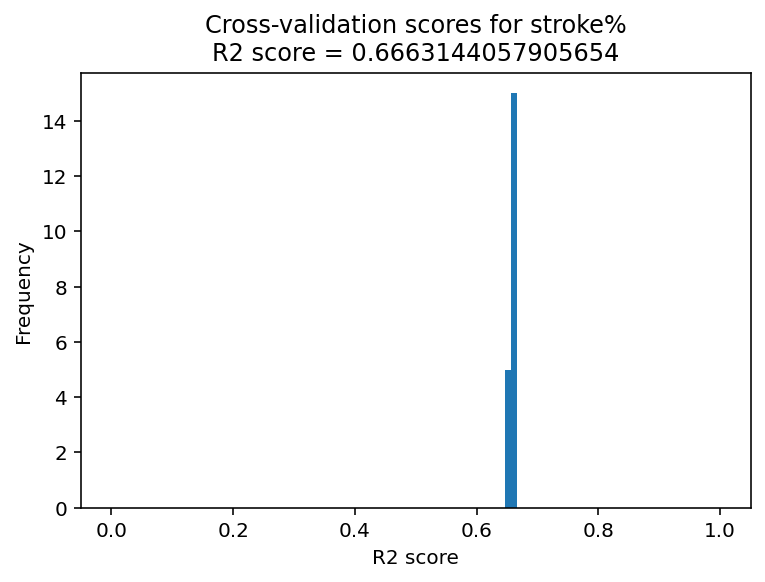

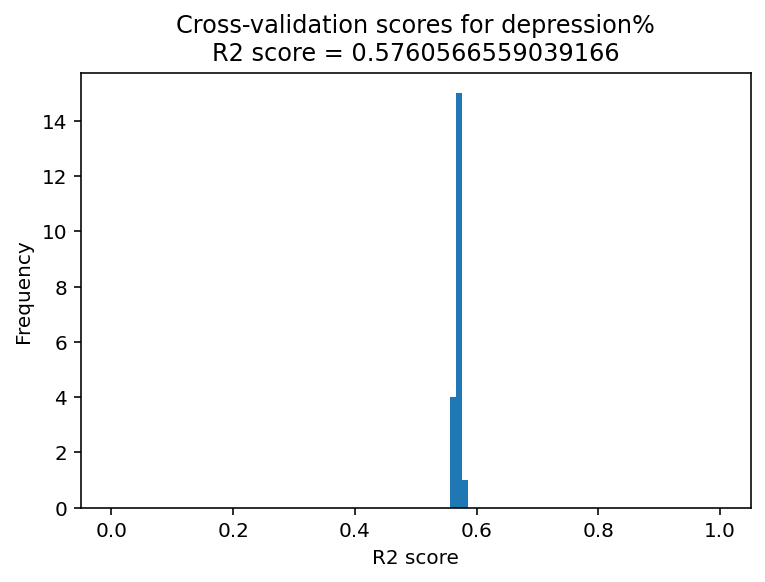

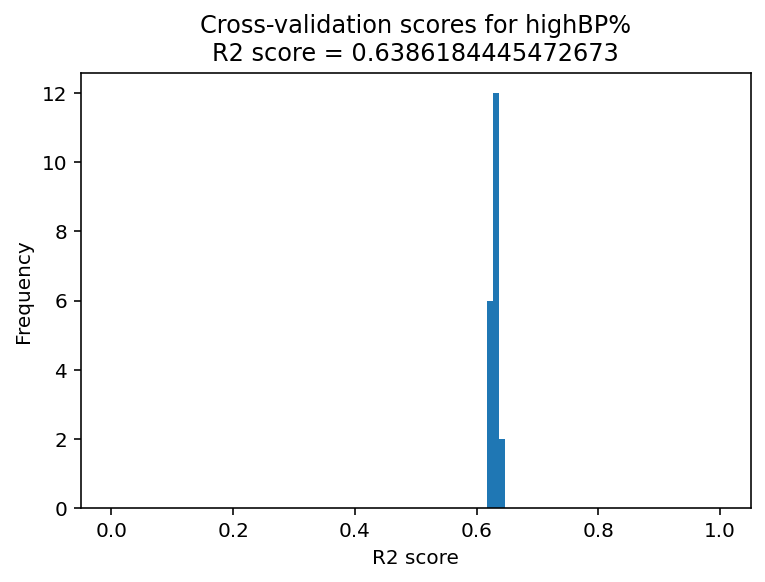

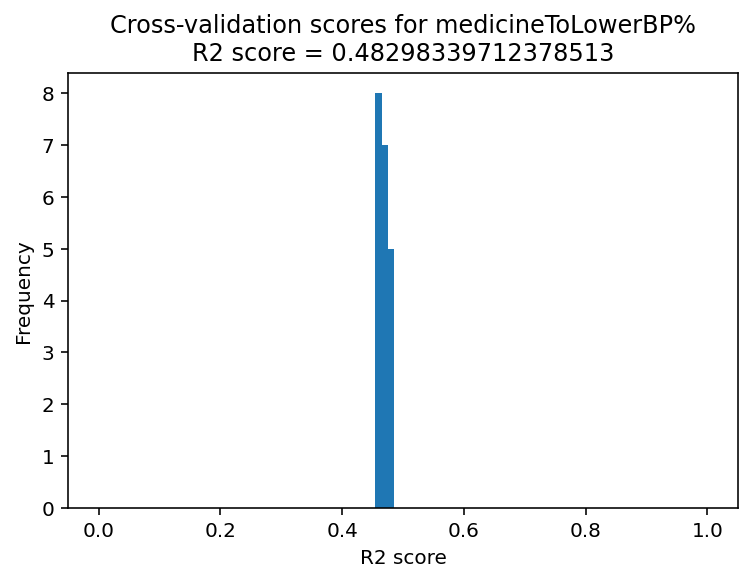

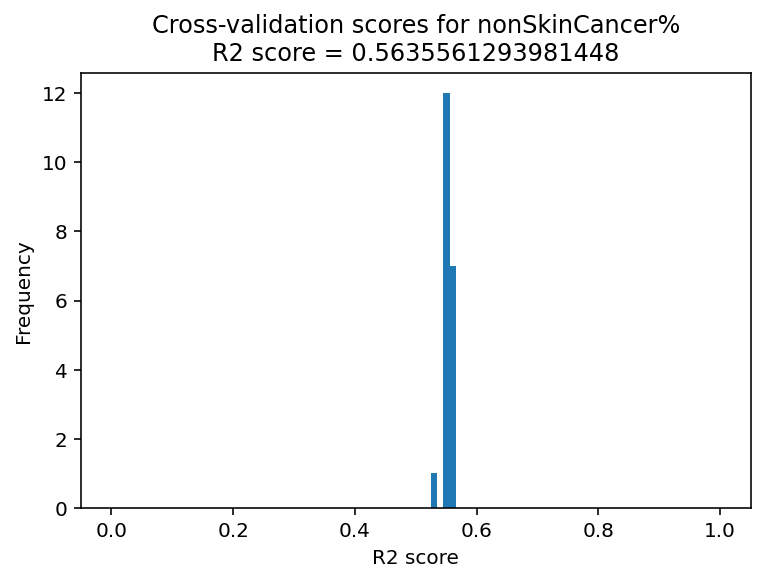

...

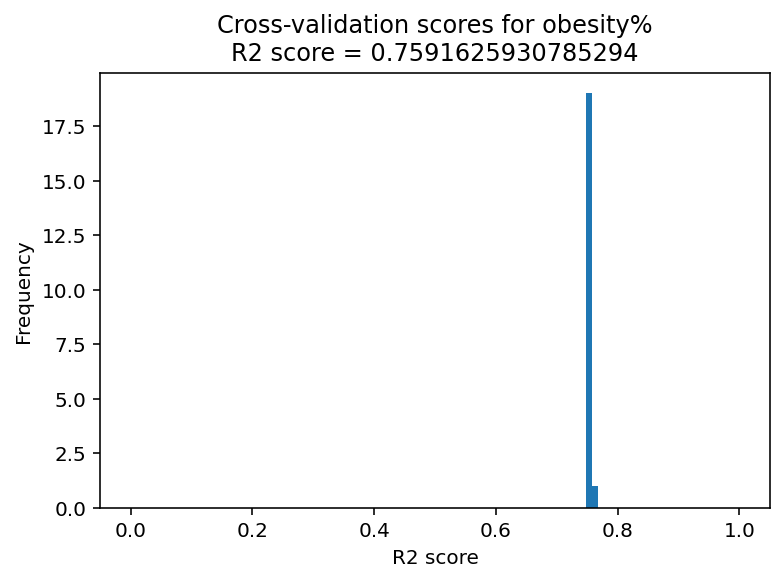

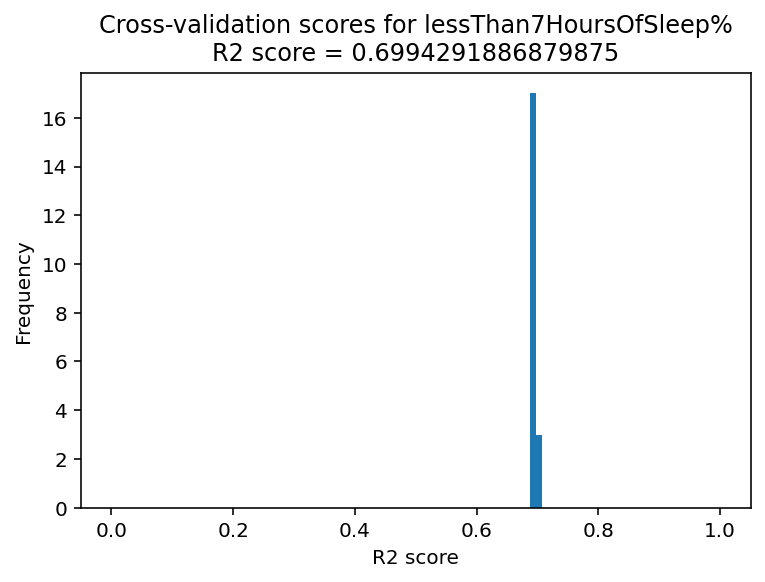

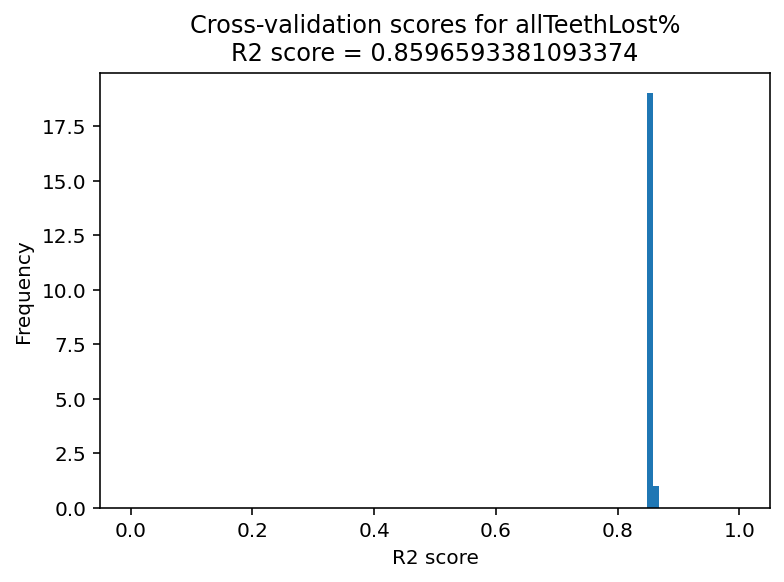

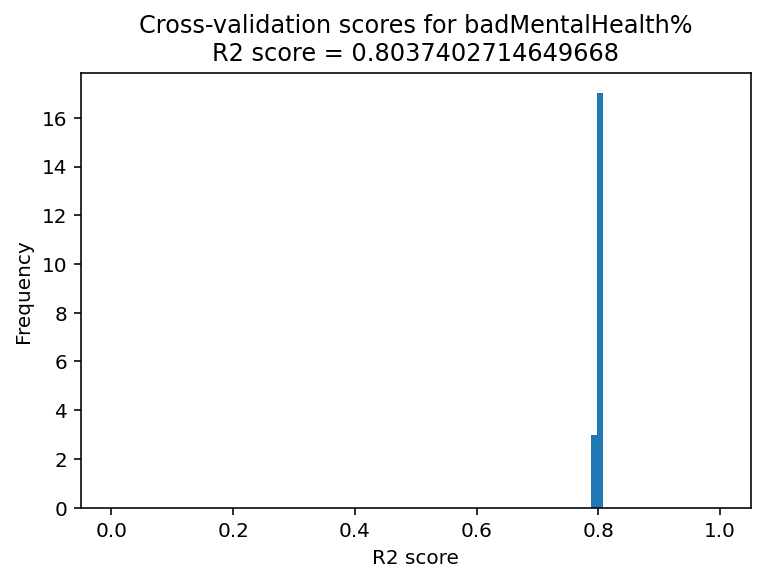

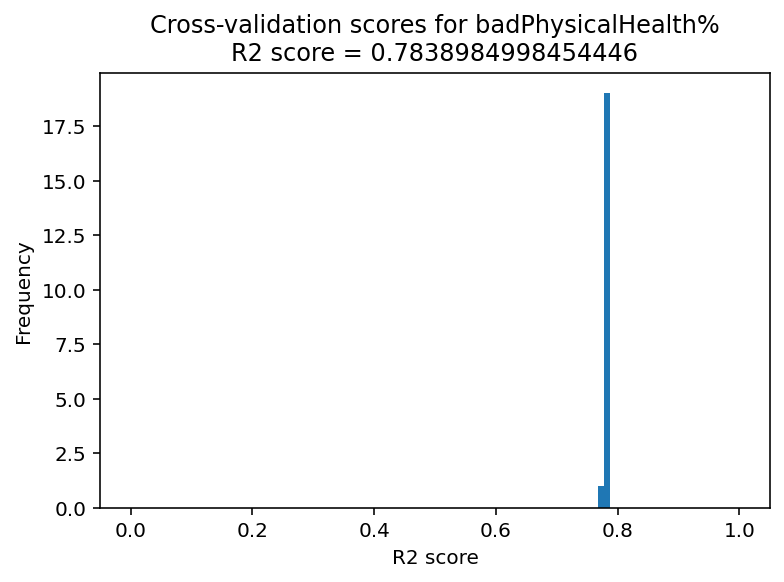

In [75]:
# Validating every decision tree at max performance
bins = np.linspace(0, 1, 100)
for i, y in enumerate(y_all):
    X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=42, test_size=0.2)
    model, score, scores = best_cross_model(DecisionTreeRegressor(max_depth=10), X_train, y_train, X_test, y_test, 20)
    score = model.score(X_test,y_test)
    plt.hist(scores, bins=bins)
    plt.title(f"Cross-validation scores for {y_cols[i]}\nR2 score = {score}")
    plt.xlabel("R2 score")
    plt.ylabel("Frequency")
    plt.show()

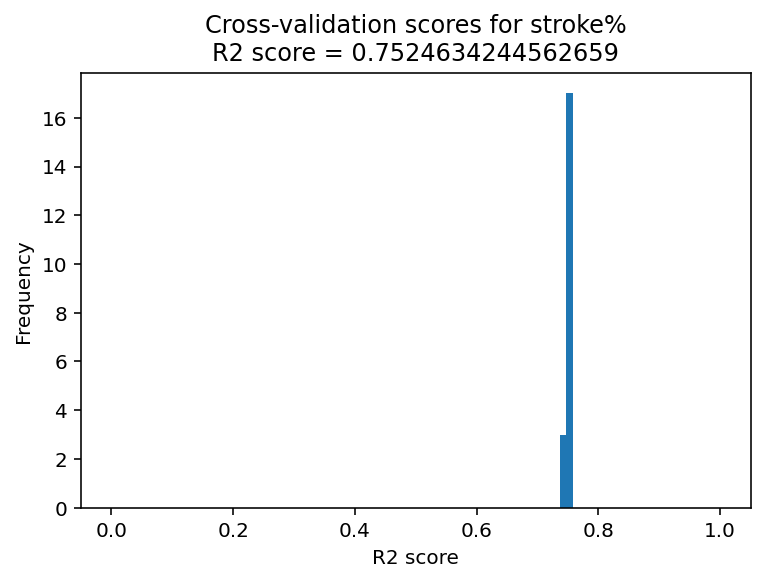

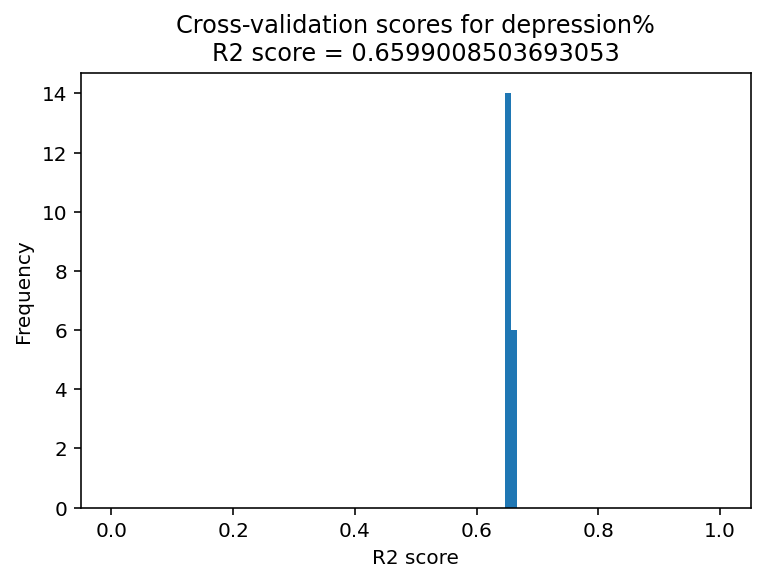

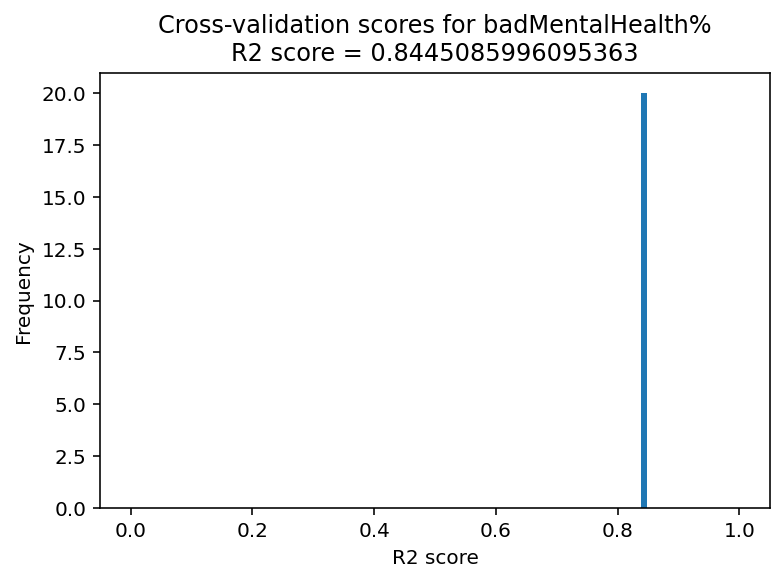

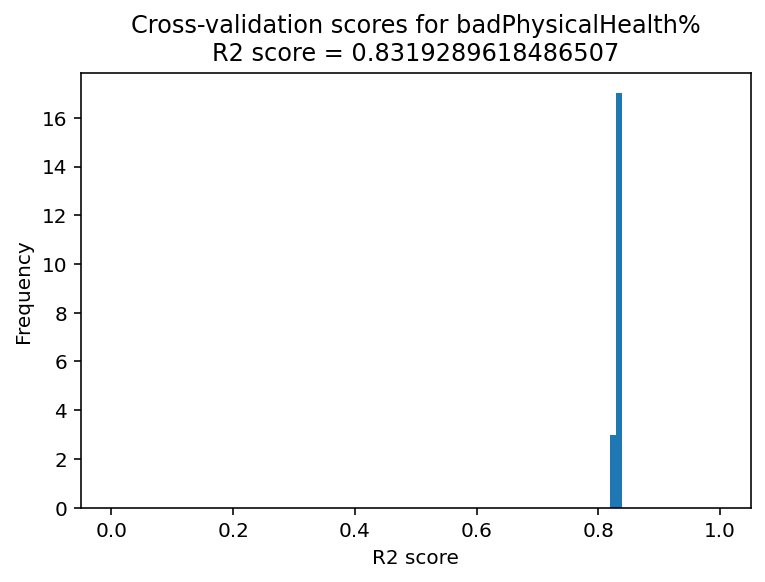

In [91]:
bins = np.linspace(0, 1, 100)

# Choosing just a few because this takes much longer to run and we run out of compute and memory resources very quickly
params = ['stroke%', 'depression%', 'badMentalHealth%', 'badPhysicalHealth%']
ys = [finalDataset[param] for param in params]

for i, y in enumerate(ys):
    X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=42, test_size=0.2)

    # Low tree count model so that everything runs in a reasonable time while maintaining accuracy close enough to optimal
    untrained_model = RandomForestRegressor(max_depth=15, n_estimators=10)
    model, score, scores = best_cross_model(untrained_model, X_train, y_train, X_test, y_test, 20)
    score = model.score(X_test,y_test)

    # Manage memory
    del X_train,X_test,y_train,y_test,model,untrained_model
    plt.hist(scores, bins=bins)
    plt.title(f"Cross-validation scores for {params[i]}\nR2 score = {score}")
    plt.xlabel("R2 score")
    plt.ylabel("Frequency")
    plt.show()

##### All the models have extremely tight distributions, which means that they are picking up on the same trend no matter how much data is left out. This means that the models are not only fitting to the data, but also have the appropriate level of complexity to match the complexity of the true distribution.



## OUTLIER ANALYSIS


### CREATING COUNTY DATA

In [38]:
#It makes much more sense to look at outliers by county data rather than tract data. Tracts are too small to prevent outliers with low population, and are usually dependent on their respective county for their services.

#One problem with aggregating tract data into county data is that we can't just take the average of prevalence percentage columns, (such as arthritis%) as a low population tract can easily influence the data with a significantly different percentage from the norm. To solve this, we implemented a weighted average function, so we can accurately get the average in each county.
def weighted_average(distribution, populations):
    numerator = sum(distribution[i]*populations[i] for i in range(len(distribution)))
    denominator = sum(populations)
    
    return round(numerator/denominator, 2)

#Grouping the data by county so it's easier to access
county_info = finalDataset.groupby(['countyName'])

#Initializing the county dataframe
county_df = pd.DataFrame([])

#Placeholder index so the code knows where to insert new columns
i = 0

#Adding the population column
county_df['population'] = county_info['population'].apply(sum)

#Taking the weighted average of all of the percentage columns in the tract dataframe
for col in  ['arthritis%',
       'highBP%', 'nonSkinCancer%', 'currentAsthma%', 'coronaryHeartDisease%','routineCheckUp%',
       'chronicObstructivePulmonaryDisease%', 'depression%', 'diabetes%', 'highCholestorol%', 'chronicKidneyDisease%',
       'badMentalHealth%', 'obesity%', 'badPhysicalHealth%', 'menUpToDateOnVaccinesAndScreenings%',
       'stroke%','noHealthInsurance%', 'men', 'women', 'hispanic', 'white', 'black', 'native',
       'asian', 'pacific', 'votingAgeCitizen', 'income', 'incomeErr','currentSmoking%',
       'incomePerCap', 'incomePerCapErr', 'poverty', 'childPoverty',
       'professional', 'service', 'office', 'construction', 'production',
       'drive', 'carpool', 'transit', 'walk', 'otherTransp', 'workAtHome',
       'meanCommute', 'employed', 'privateWork', 'publicWork', 'selfEmployed',
       'familyWork', 'unemployment', '%LessThan9thGrade',
       '%HighSchoolGraduate', '%SomeCollege,NoDegree', '%AssociatesDegree',
       '%BachelorsDegree', '%GraduateOrProfessionalDegree',
       '%PercentHighSchoolGraduateOrHigher', '%PercentBachelorsDegreeOrHigher',
       '%PovertyLessThanHighSchoolGraduate', '%PovertyHighSchoolGraduate',
       '%PovertySomeCollegeOrAssociatesDegree',
       '%PovertyBachelorsDegreeOrHigher']:
    temp_col=[]
    #Getting the weighted average of the column for each county and adding it to the dataframe, using the "i" placeholder from earlier.
    for county in county_df.index:
        df = county_info.get_group(county)
        temp_col.append(weighted_average(np.array(df[col]),np.array(df.population)))
    county_df.insert(i,col, temp_col)
    
    #Adding a normalized column to the dataframe.
    string = 'normalized' + col[0].upper() + col[1:]
    county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]
    
    #Increasing the index for the next insertion.
    i+=2

#Adding region information to the dataframe. We can safely take the region info of the first tract per county since all tracts will be in the same region.
county_df['regionInitials'] = county_info['regionInitials'].first()
#Copying the dataframe to prevent fragmenting.
county_df = county_df.copy()

/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)


/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)
/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)
/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)
/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)
/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)


/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)


/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)
/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)
/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)


/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)


/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)


/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


/tmp/ipykernel_7620/3748194474.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df.insert(i,col, temp_col)


/tmp/ipykernel_7620/3748194474.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  county_df[string] = [(x - np.min(temp_col))/(np.max(temp_col)-np.min(temp_col)) for x in temp_col]


KeyError: 'Column not found: regionInitials'

In [33]:
county_df.head()

,arthritis%,population,highBP%,normalizedArthritis%,nonSkinCancer%,normalizedHighBP%,currentAsthma%,normalizedNonSkinCancer%,coronaryHeartDisease%,normalizedCurrentAsthma%,...,normalized%PercentHighSchoolGraduateOrHigher,%PovertyLessThanHighSchoolGraduate,normalized%PercentBachelorsDegreeOrHigher,%PovertyHighSchoolGraduate,normalized%PovertyLessThanHighSchoolGraduate,%PovertySomeCollegeOrAssociatesDegree,normalized%PovertyHighSchoolGraduate,%PovertyBachelorsDegreeOrHigher,normalized%PovertySomeCollegeOrAssociatesDegree,normalized%PovertyBachelorsDegreeOrHigher
countyName,,,,,,,,,,,,,,,,,,,,,
Abbeville,31.82,25417,43.21,0.623985,7.62,0.692215,10.36,0.508523,8.39,0.385892,...,0.648955,36.07,0.136413,20.30,0.417477,13.85,0.429315,7.66,0.337970,0.324576
Acadia,29.38,61773,40.52,0.529594,6.95,0.611044,10.38,0.413352,8.04,0.388658,...,0.630139,35.12,0.102208,17.59,0.406481,15.02,0.370555,4.43,0.366520,0.187712
Accomack,32.44,33159,43.36,0.647969,7.95,0.696741,10.52,0.555398,8.47,0.408022,...,0.706620,27.79,0.199646,14.32,0.321644,13.58,0.299653,3.64,0.331381,0.154237
Ada,21.22,383772,27.06,0.213926,6.23,0.204888,9.29,0.311080,4.71,0.237898,...,0.927178,23.07,0.436222,13.18,0.267014,10.10,0.274935,5.26,0.246462,0.222881
Adair,30.90,72041,38.30,0.588395,7.47,0.544056,10.98,0.487216,8.64,0.471646,...,0.743554,31.26,0.211229,18.88,0.361806,15.50,0.398526,6.96,0.378233,0.294915


In [34]:
lowInc = county_df[county_df['income']<50000]
medInc = county_df[(county_df['income']<100000)][(county_df['income']>=50000)]
highInc = county_df[county_df['income']>=100000]

/tmp/ipykernel_7620/3374654324.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  medInc = county_df[(county_df['income']<100000)][(county_df['income']>=50000)]


In [37]:
lowInc = lowInc.sort_values('badPhysicalHealth%',axis=0)
lowInc[['income','badMentalHealth%','badPhysicalHealth%','obesity%','%PercentHighSchoolGraduateOrHigher','routineCheckUp%','badPhysicalHealth%','currentSmoking%']].head(10)

KeyError: "['currentSmoking%'] not in index"

In [36]:
lowInc[['income','badMentalHealth%','badPhysicalHealth%','obesity%','%PercentHighSchoolGraduateOrHigher','routineCheckUp%','currentSmoking%']].tail(10)

,income,badMentalHealth%,badPhysicalHealth%,obesity%,%PercentHighSchoolGraduateOrHigher,routineCheckUp%,menUpToDateOnVaccinesAndScreenings%
countyName,,,,,,,
Knott,31261.95,21.31,22.24,38.54,73.77,81.28,30.94
Apache,32392.22,22.85,22.53,36.81,78.17,71.92,17.94
Leslie,28593.79,21.93,22.68,41.48,68.41,80.90,33.45
Tensas,23447.45,21.43,22.72,45.52,76.10,83.37,19.44
Mingo,30715.92,23.75,22.84,48.43,74.33,78.70,40.02
Clinch,22300.07,23.57,23.14,41.18,73.28,76.04,22.71
Kenedy,24800.00,18.80,23.30,43.60,41.30,70.50,16.00
Wolfe,23990.00,21.91,23.39,45.21,69.24,80.38,31.46
Presidio,28607.31,17.45,23.63,45.17,52.95,73.04,16.86


In [17]:
medInc = medInc.sort_values('badPhysicalHealth%',axis=0)
medInc[['income','badMentalHealth%','badPhysicalHealth%','obesity%','%PercentHighSchoolGraduateOrHigher','routineCheckUp%','menUpToDateOnVaccinesAndScreenings%']].head(10)


,income,badMentalHealth%,badPhysicalHealth%,obesity%,%PercentHighSchoolGraduateOrHigher,routineCheckUp%
countyName,,,,,,
Hand,50428.29,9.94,10.67,31.92,92.43,77.48
Stanley,63233.00,10.10,9.30,31.40,93.10,75.20
Griggs,50272.00,10.20,13.00,36.90,89.80,75.50
Edmunds,63799.77,10.24,10.69,34.00,90.80,76.61
Aurora,57257.00,10.30,10.60,32.10,87.60,76.80
Dickey,59453.72,10.34,10.87,33.29,88.85,73.73
Cavalier,66298.85,10.35,12.29,35.27,91.96,74.66
Foster,59500.00,10.40,11.60,35.20,88.80,73.80
Kingsbury,58743.19,10.42,10.90,30.81,90.66,76.68


In [24]:
highInc = highInc.sort_values('badPhysicalHealth%',axis=0)
highInc[['income','badMentalHealth%','badPhysicalHealth%','obesity%','%PercentHighSchoolGraduateOrHigher','routineCheckUp%','menUpToDateOnVaccinesAndScreenings%']].head(30)

,income,badMentalHealth%,badPhysicalHealth%,obesity%,%PercentHighSchoolGraduateOrHigher,routineCheckUp%
countyName,,,,,,
Arlington,122354.33,10.96,7.49,23.08,93.75,74.55
Falls Church,114829.47,9.86,7.72,27.99,98.17,79.51
Loudoun,133430.48,11.13,8.31,27.10,93.24,78.14
Fairfax,125977.55,10.70,8.76,24.59,91.84,76.17
Los Alamos,109186.53,10.67,9.02,24.96,97.98,71.07
Santa Clara,112941.62,10.72,9.07,21.29,87.13,71.53
Alexandria,100660.66,12.43,9.20,28.43,90.65,76.11
Fairfax City,103074.51,11.17,9.23,26.70,92.14,78.28
San Mateo,112753.75,10.75,9.54,20.75,88.41,71.59
